# ClineHelpR INTROGRESS X Environment Tutorial

Plot INTROGRESS genomic cline results and correlate clines with environmental variables.

ClineHelpR provides INTROGRESS tools spanning input file conversion and parsing and plotting the results. Finally, ClineHelpR provides tools for performing ecological niche modeling to correlate environmental variables with the INTROGRESS output. 

The BGC and INTROGRESS software packages are described elsewhere (Gompert and Buerkle, 2010, 2011, 2012; Gompert et al., 2012a, 2012b).

## Software Flow Diagram

<img src="img/flowchart_ClinePlotR.png" width=100% height=100% />

## Example Dataset

All example data are available from a Dryad Digital Repository (https://doi.org/10.5061/dryad.b2rbnzsc8), as the files are too large for GitHub. To run the example data, download the exampleData directory from DRYAD, then run the R scripts in the ClineHelpR/scripts directory.

**NOTE**: For all the analyses below, we will use the example dataset. The current working directory is ```/home/user/app/notebooks```, and we will place the example data in ```"../data/exampleData"```. ```../data``` and ```notebooks``` are volumes that are automatically created for you in the docker container, and they allow you to interface between your host system and the docker container. When you run docker, create a directory to keep the input and output, and create subdirectories in it called ```data/```, ```notebooks/```, and ```results/```.

## Installation

See the GitHub README page for installation instructions.  

## Pipeline

There are R and python scripts in the ClineHelpR/scripts directory that allow you to run our whole pipeline. All the steps from below can be run by modifying and using those scripts. We also demonstrate each step in this tutorial.

## Step 1: Data Filtering (optional)  

Data filtering is important for reducing noise and keeping uninformative sites from swamping out real signals in the data. We therefore recommend applying missing data and minor allele frequency filters. Additionally, non-biallelic sites should be removed because BGC assumes that all sites are bi-allelic. While filtering the data is outside the scope of ClineHelpR, below is a link to a GitHub Repository containing two scripts, *nremover.pl* and *phylipFilterPops.pl*, that can be used for appropriate data filtering.

https://github.com/tkchafin/scripts

+ *nremover.pl* applies per-individual and per-site missing data filters, bi-allelic, and minor allele frequeny filters.
+ *phylipFilterPops.pl* can apply missing data filtering per-population. 

There are also numerous other useful file conversion scripts in this repository that you might be interested in using. If you are using docker, the filtering scripts are included in the ```$HOME/app/src/scripts``` directory and are already in your path.

Additionally, our ```genind2introgress()``` and ```genind2bgc()``` ClineHelpR functions can perform per-individual and per-site filtering to remove individuals or sites that exceed a specified missing data threshold.

## Step 2: INTROGRESS Clines X Environment

### Find the Most Important Raster Layers

If you want to make the Clines X Environment plots for INTROGRESS, you'll need some raster and sampling data. We provide tools to process these raster files with the sample locality data and perform ecological niche modeling to select the most important raster files in a directory of rasters.

These functions serve to run INTROGRESS (Gompert and Buerkle, 2010), then correlate the genomic clines with latitude, longitude, and any environmental variables you want. To do this, you need a file with sample coordinates (see format below) and input raster layers. There can be multiple raster layers (e.g., the 19 BioClim layers from https://worldclim.org), and ClineHelpR will correlate each one with the INTROGRESS variables. 

We can get a bunch of raster layers and determine which are the most important as determined by species distribtution modeling. This info can then be used to correlate significant INTROGRESS loci (see below) with the most important environmental features, plus latitude and longitude. We will use a wrapper package called ENMeval 2.0 (Kass et al., 2021) to run MAXENT (Phillips et al., 2004, 2006) for the species distribution modeling. See the [ENMeval package](https://cran.r-project.org/web/packages/ENMeval/index.html) from CRAN. You will need the maxent.jar file to be placed in dismo's java directory, which should be where R installed your dismo package. E.g., mine was placed here, where my dismo R package is installed:   

```"C:/Users/btm/Documents/R/win-library/3.6/dismo/java/maxent.jar"```  

Herein, we will be using the BioClim (https://worldclim.org/) raster dataset at the finest resolution available. This dataset includes 19 rasters corresponding to different environmental variables. Please check out their website to see the variables they include in the BioClim dataset. 

Here are the raster layers that we pre-downloaded and will be using. Note that we have already pre-cropped them to the North American Region, as the BioClim data are global. If you do this, just make sure you don't cut off some of the sampling extent.

In [2]:
list.files(path = "../data/exampleData/ENMeval_bioclim/rasterLayers/cropped")

[1] "a_crop_nlcd2011_resampled.tif"    "crop_wc2.1_30s_bio_1.tif"        
 [3] "crop_wc2.1_30s_bio_10.tif"        "crop_wc2.1_30s_bio_11.tif"       
 [5] "crop_wc2.1_30s_bio_12.tif"        "crop_wc2.1_30s_bio_13.tif"       
 [7] "crop_wc2.1_30s_bio_14.tif"        "crop_wc2.1_30s_bio_15.tif"       
 [9] "crop_wc2.1_30s_bio_16.tif"        "crop_wc2.1_30s_bio_17.tif"       
[11] "crop_wc2.1_30s_bio_18.tif"        "crop_wc2.1_30s_bio_19.tif"       
[13] "crop_wc2.1_30s_bio_2.tif"         "crop_wc2.1_30s_bio_3.tif"        
[15] "crop_wc2.1_30s_bio_4.tif"         "crop_wc2.1_30s_bio_5.tif"        
[17] "crop_wc2.1_30s_bio_6.tif"         "crop_wc2.1_30s_bio_7.tif"        
[19] "crop_wc2.1_30s_bio_8.tif"         "crop_wc2.1_30s_bio_9.tif"        
[21] "crop_wc2.1_30s_elev.tif"          "crop_wc_solarRAD_annualMean.tif" 
[23] "crop_wc_windSpeed_annualMean.tif"

Now let's look at the sampling locality data. It should be a comma-delimited file (CSV).

In [ ]:
head(read.csv(file = "../data/exampleData/ENMeval_bioclim/localityInfo/sample_localities_maxent_southeast_noNA.csv"))

,SampleID,TaxonomicID,Latitude,Longitude
,<chr>,<chr>,<dbl>,<dbl>
1,EAAL_BX1380,T. carolina carolina,32.46535,-85.19982
2,EAAL_BX1387,T. carolina carolina,32.08412,-85.69020
3,EAAL_BX211,T. carolina carolina,32.43992,-85.35198
4,EAAL_BXEA27,T. carolina carolina,34.44550,-85.77720
5,EAGA_BX217,T. carolina carolina,32.61337,-84.81550
6,EAGA_BX219,T. carolina carolina,32.62687,-84.99683


Let's load the ClineHelpR library.

In [1]:
library("ClineHelpR")

### Prepare Rasters for ENMeval

Now let's use the ```prepare_rasters()``` function to get the raster layers ready for ENMeval. This function will take all the rasters in a directory and put them in a single R object that can be iterated over easily. It will also crop them to the sampling extent with a bounding box, plus a buffer so that samples near the edge don't get cut off. If you want to adjust the buffer, just use the ```bb.buffer``` option (measured in arc-seconds).

You will get an error if one or more of your samples falls on an NA value for any of your input rasters. If this happens, just remove the offending individual(s) from the sample.file file and re-run prepare_rasters(). The error message will print out a list of individuals with NA values in each raster layer.  

You can change the bb.buffer argument to a larger or smaller value. ```prepare_rasters()``` will crop your raster layers to the sampling locality extent, and if bb.buffer = 0.5, a 0.5 degree buffer will be added to the sampling extent. This is useful for making the background points later.  

If your sample.file has a header line, set header = TRUE. If not, set header = FALSE.

NOTE: We subset the raster layers for this tutorial for the sake of time and resources.

In [2]:
dataDIR <- "../data/exampleData/ENMeval_bioclim"
plotDIR <- "./plots"



Order of raster files: 

1: ../data/exampleData/ENMeval_bioclim/rasterLayers/subset/a_crop_nlcd2011_resampled.tif
2: ../data/exampleData/ENMeval_bioclim/rasterLayers/subset/crop_wc2.1_30s_bio_1.tif
3: ../data/exampleData/ENMeval_bioclim/rasterLayers/subset/crop_wc2.1_30s_bio_2.tif
4: ../data/exampleData/ENMeval_bioclim/rasterLayers/subset/crop_wc2.1_30s_bio_3.tif


Loaded 4 raster layers..


Cropping to samples with buffer of 0.25 degrees


Cropping background layers with buffer of 0.5 degrees

Saving raster plot 1 to disk...
Saving raster plot 2 to disk...
Saving raster plot 3 to disk...
Saving raster plot 4 to disk...
Saving raster plot 1 to disk...
Saving raster plot 2 to disk...


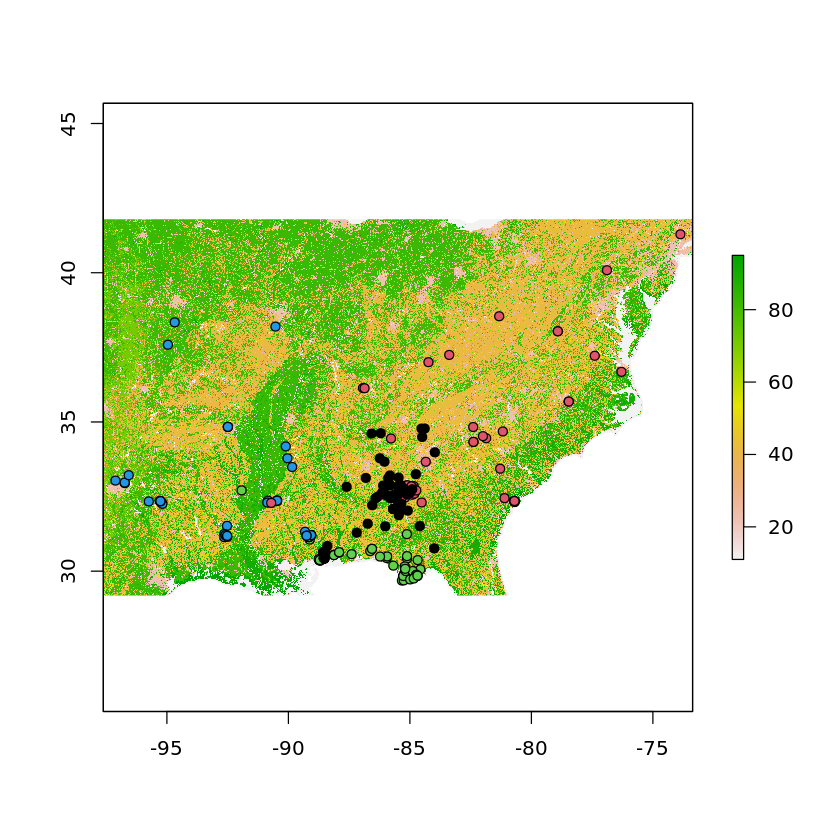

Saving raster plot 3 to disk...


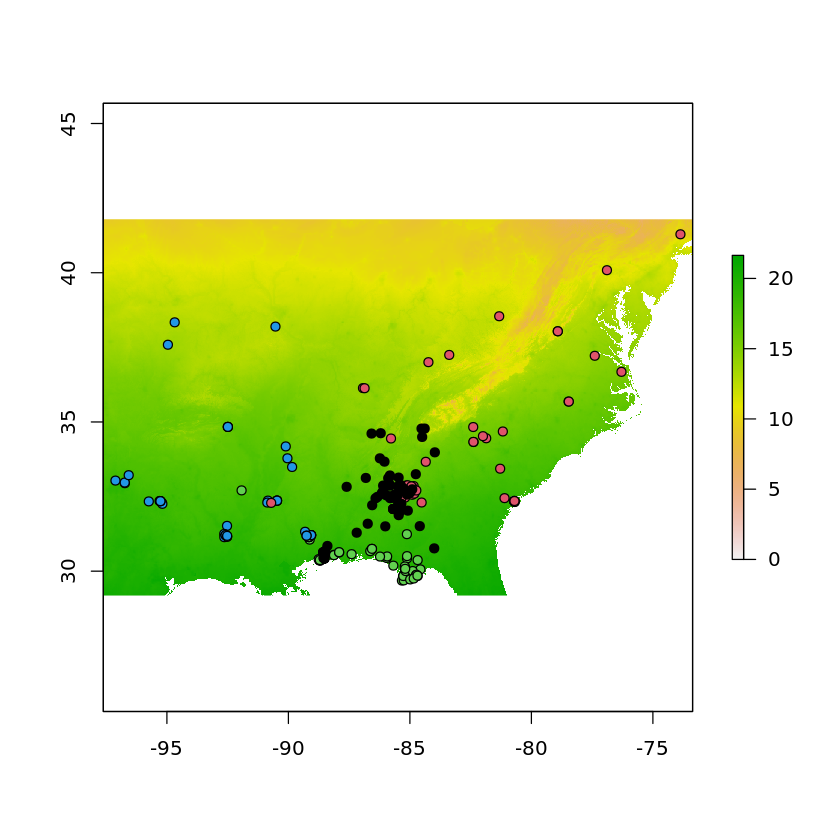

Saving raster plot 4 to disk...


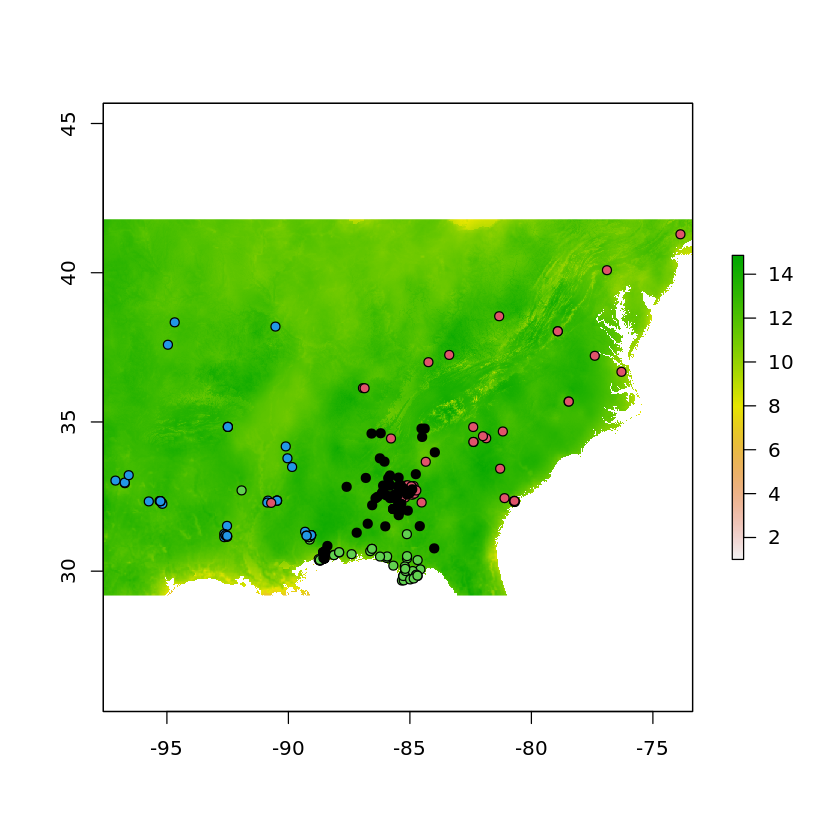

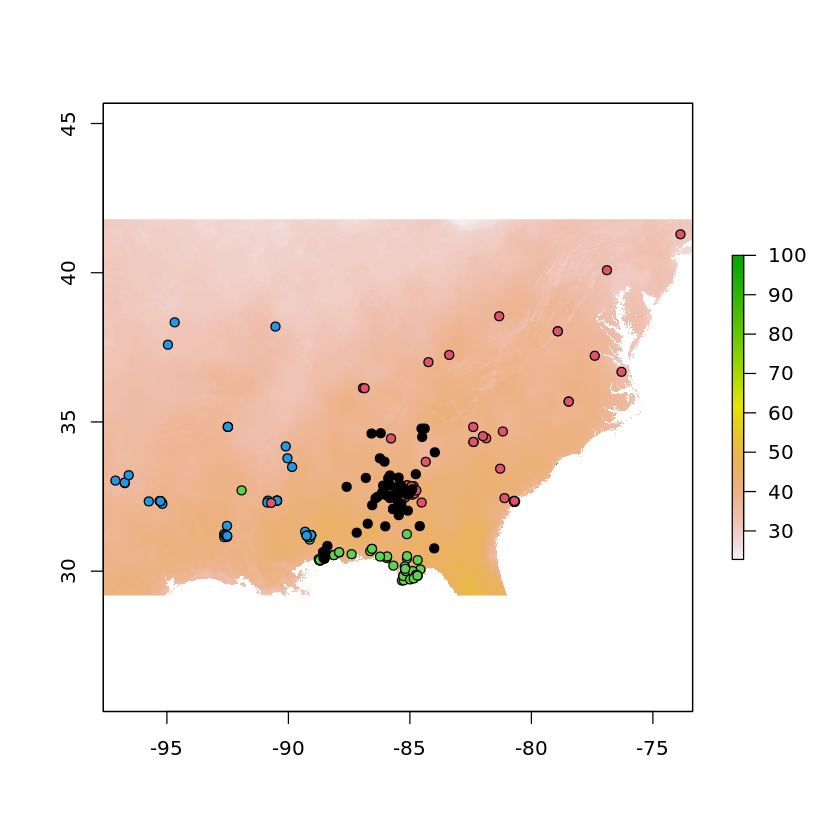

In [3]:
envList <-
  prepare_rasters(
    raster.dir = file.path(dataDIR, "rasterLayers", "subset"), # Directory containing all the raster files you want to use
    sample.file = file.path("../data", # File with sample locality data
                            "exampleData",
                            "ENMeval_bioclim",
                            "localityInfo",
                            "sample_localities_maxent_southeast_noNA.csv"), # Cannot be any NAs in the sample points.
    header = TRUE, # Whether sample.file has a header line.
    bb.buffer = 0.5, # Size of the buffer for the sampling extent in arc-seconds.
    plotDIR = plotDIR, # where to save the plots.
    showPLOTS = TRUE # Whether to print the plots to the screen.
  )

There are the environmental layers with the sampling points plotted on them. Note that we also added solar radiation and wind speed layers to the BioClim layers in our exampleData.

Let's look at the envList object.

In [6]:
envList

[[1]]
class      : RasterBrick 
dimensions : 1453, 2850, 4141050, 4  (nrow, ncol, ncell, nlayers)
resolution : 0.008333333, 0.008333337  (x, y)
extent     : -97.36667, -73.61667, 29.43333, 41.54167  (xmin, xmax, ymin, ymax)
crs        : +proj=longlat +datum=WGS84 +no_defs 
source     : memory
names      : a_crop_nlcd2011_resampled, crop_wc2.1_30s_bio_1, crop_wc2.1_30s_bio_2, crop_wc2.1_30s_bio_3 
min values :                  11.00000,              0.00000,              1.00000,             24.40982 
max values :                  95.00000,             21.40417,             14.86667,            100.00000 


[[2]]
class      : RasterBrick 
dimensions : 1513, 2910, 4402830, 4  (nrow, ncol, ncell, nlayers)
resolution : 0.008333333, 0.008333337  (x, y)
extent     : -97.61667, -73.36667, 29.18333, 41.79167  (xmin, xmax, ymin, ymax)
crs        : +proj=longlat +datum=WGS84 +no_defs 
source     : memory
names      : a_crop_nlcd2011_resampled, crop_wc2.1_30s_bio_1, crop_wc2.1_30s_bio_2, crop_wc2

You can see that it saves relevant data, including the RasterStack, the coordinates, the sampleIDs, the taxonomicIDs, and more.

### Generate Background Points

Now you need to run ```partition_raster_bg()```. This will generate a bunch of background points for when you run MAXENT. See the ENMeval and MAXENT documentation.

This will also generate several PDFs that you can look at to decide which type of background partition you want to use. See the ENMeval documentation for more information.

1. All your input rasters with sample localities overlaid as points.  
2. Background points for several partitioning methods. See the ENMeval vignette for more info on bg partitions.  

The background partition methods that ClineHelpR supports are: ```block```, ```checkerboard1```, and ```checkerboard2```. You can also adjust the number of background points you want with the ```number.bg.points option```. 

Let's run it. Note that you should include far more background points than we did here. The default is 10000. We reduced the number for the tutorial.



Generating 500 random points...

Saving background partition plots...

Performing block method...


Plotting first raster in stack...

Plotting first raster in stack...

Warning message:
"Removed 87 rows containing non-finite values (stat_bin)."


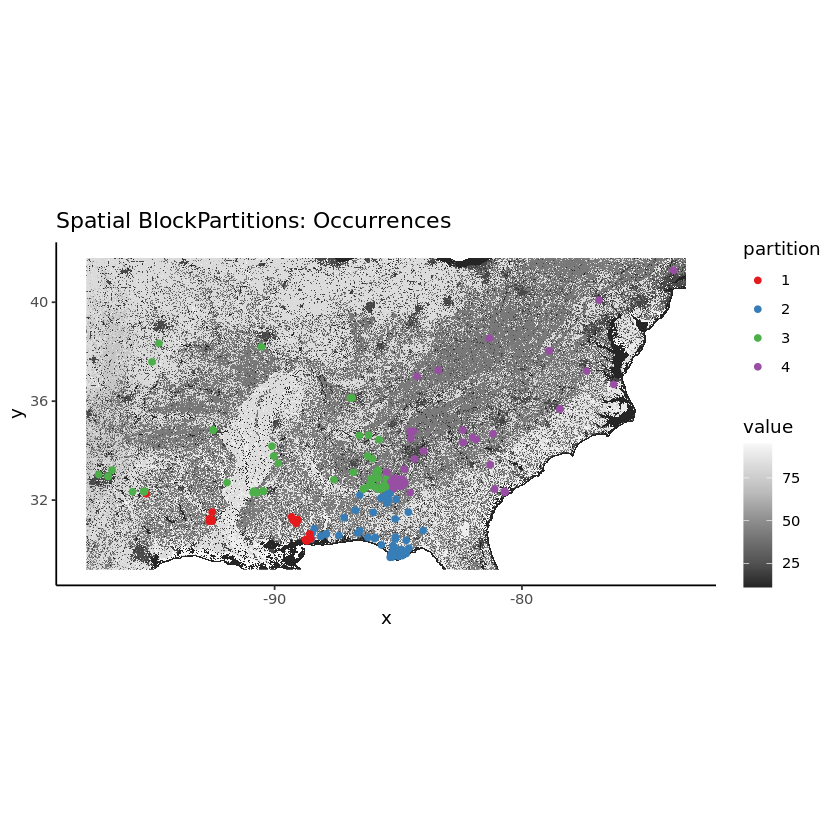

Warning message:
"Removed 87 rows containing non-finite values (stat_bin)."


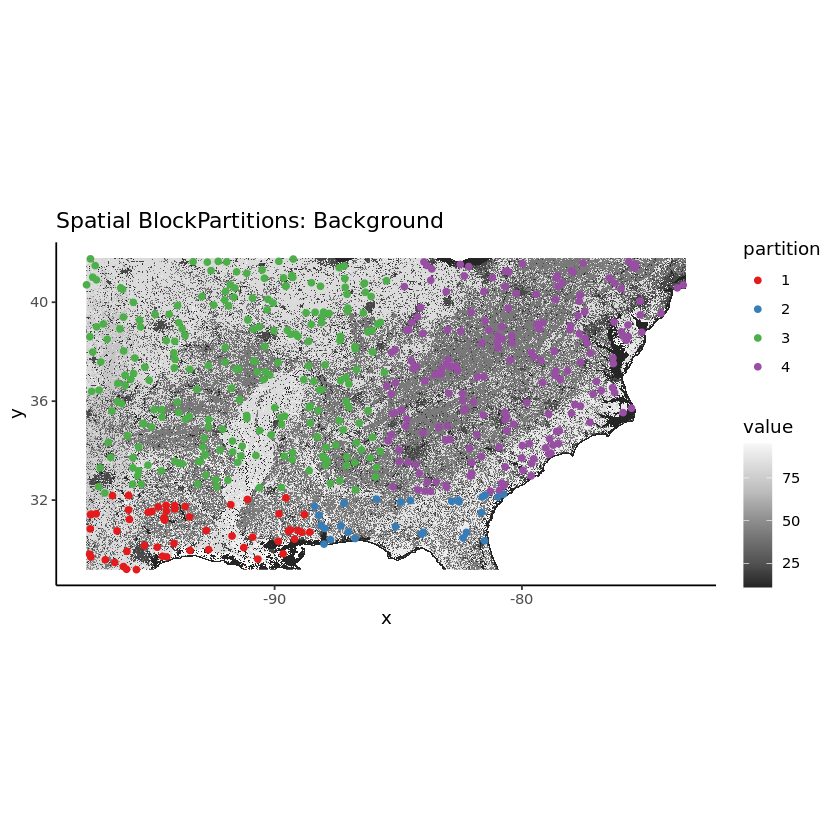

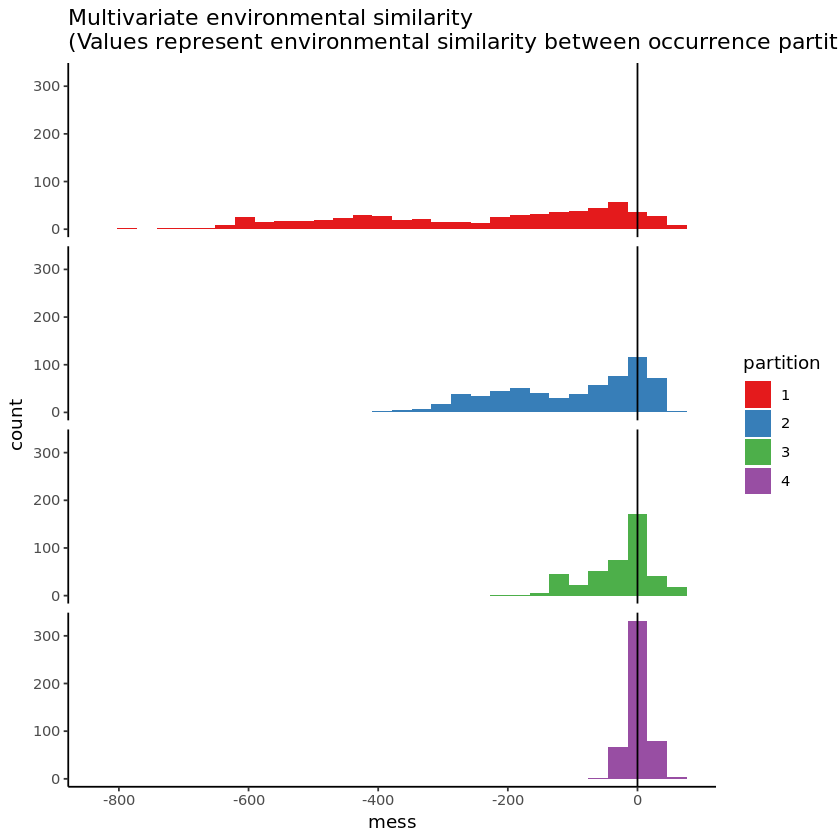

Performing checkerboard1 method...


Plotting first raster in stack...

Plotting first raster in stack...

Warning message in RColorBrewer::brewer.pal(nk, "Set1"):
"minimal value for n is 3, returning requested palette with 3 different levels
"
Warning message in RColorBrewer::brewer.pal(nk, "Set1"):
"minimal value for n is 3, returning requested palette with 3 different levels
"
Warning message in RColorBrewer::brewer.pal(nk, "Set1"):
"minimal value for n is 3, returning requested palette with 3 different levels
"
Warning message:
"Removed 29 rows containing non-finite values (stat_bin)."


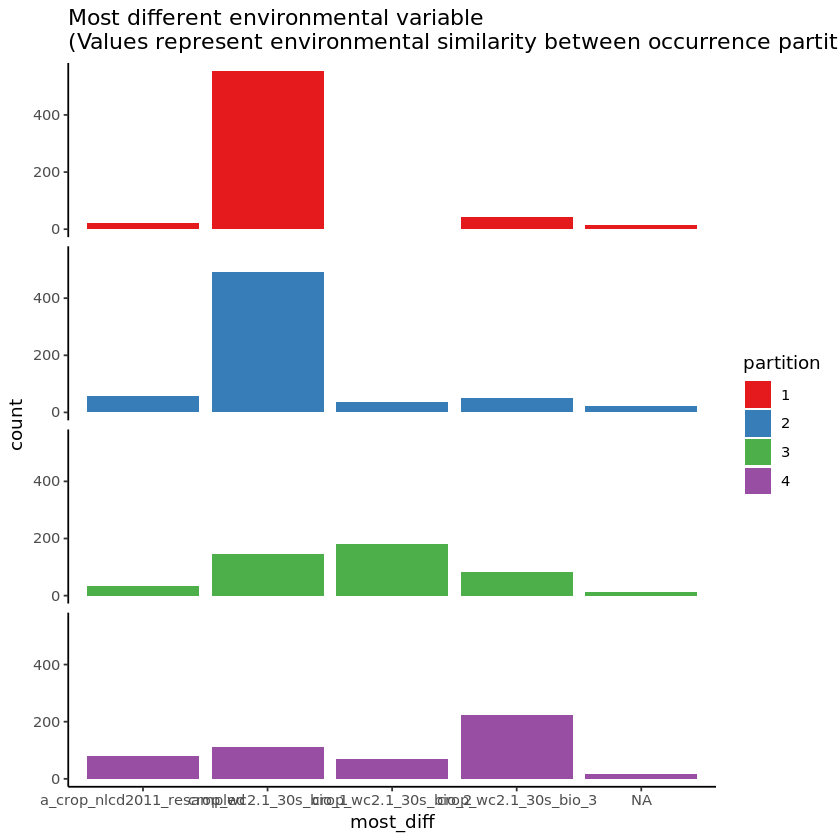

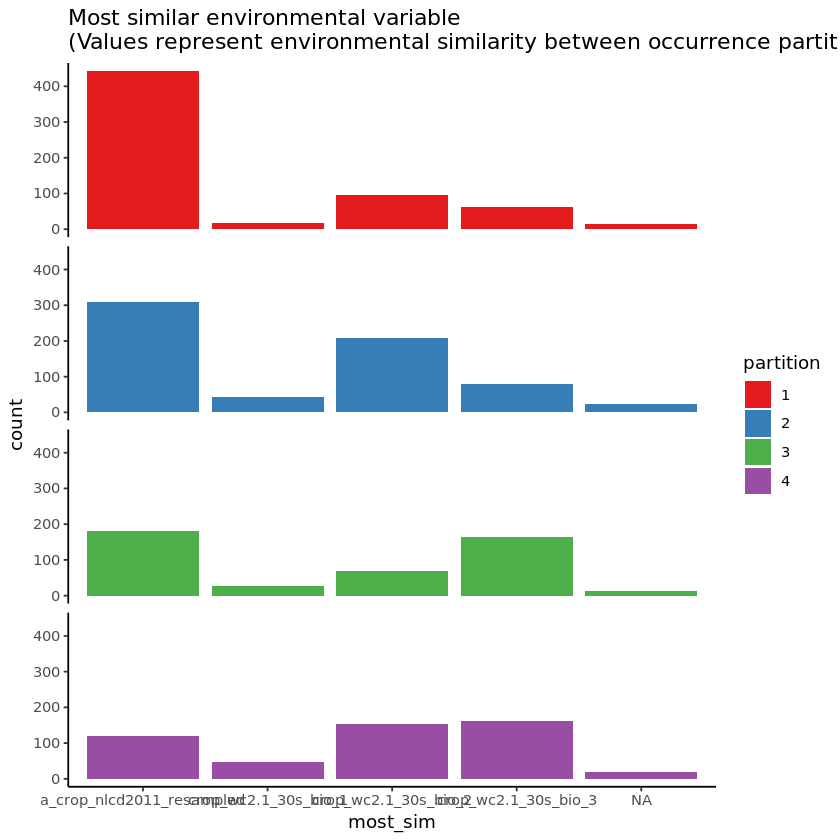

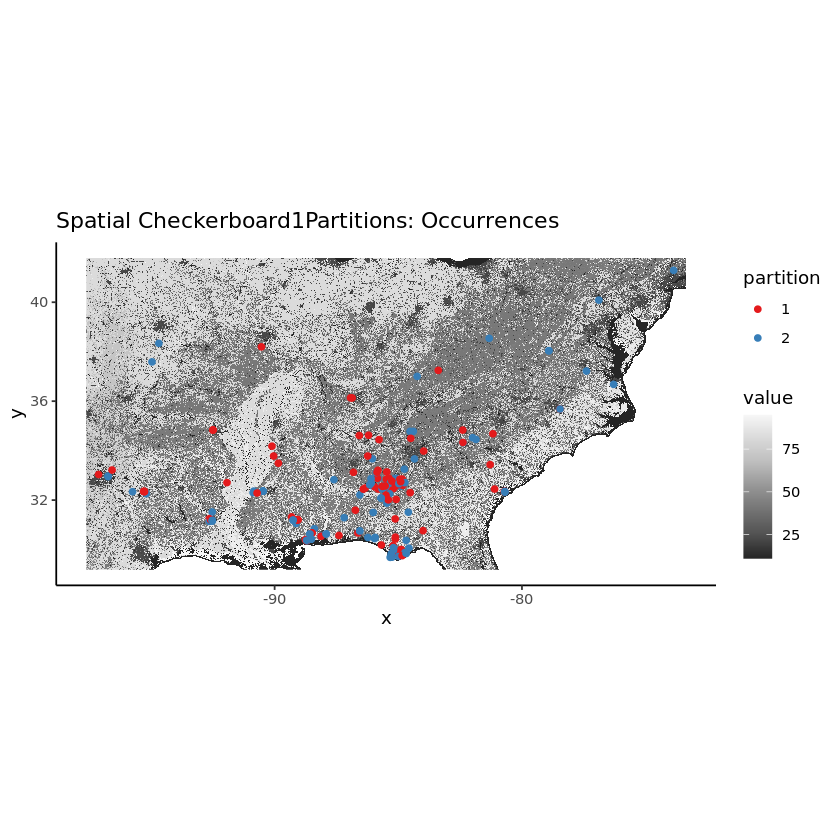

Warning message:
"Removed 29 rows containing non-finite values (stat_bin)."


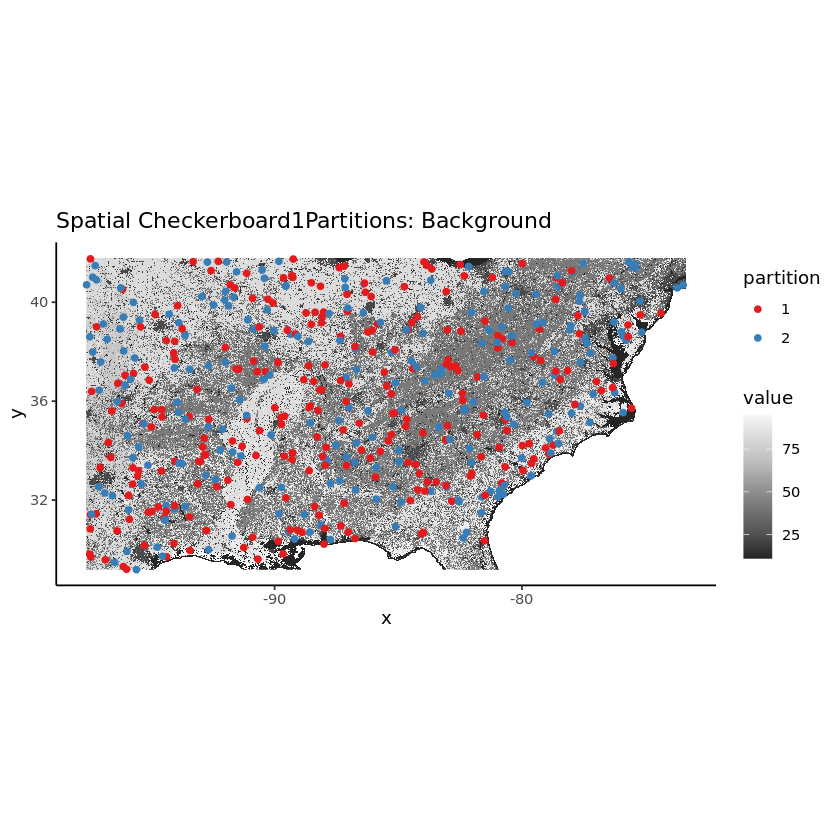

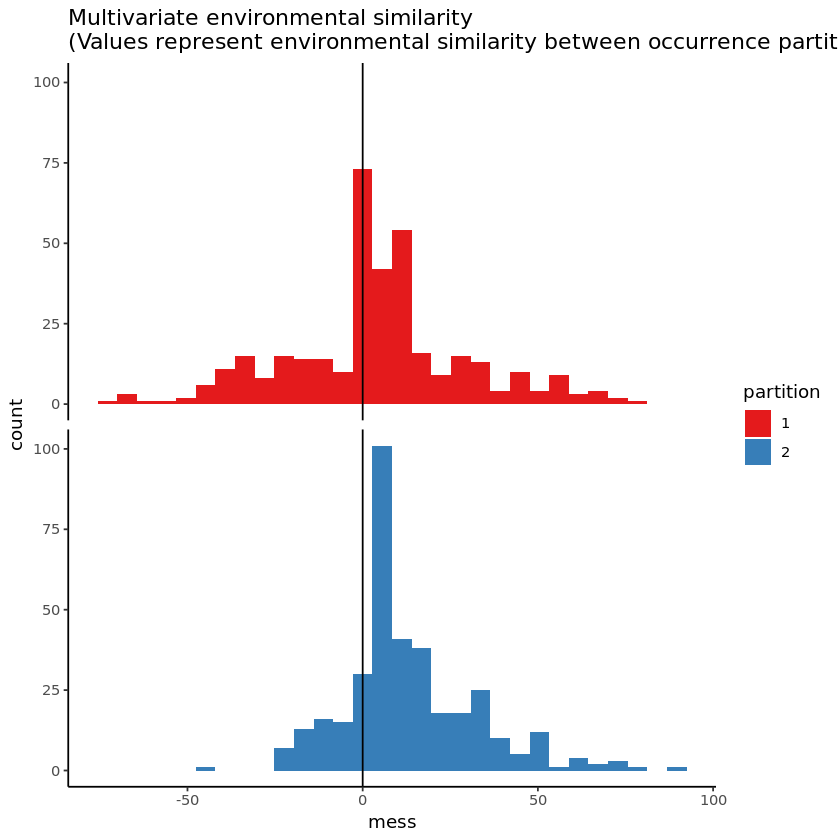

Performing checkerboard2 method...


Plotting first raster in stack...

Plotting first raster in stack...

Warning message:
"Removed 87 rows containing non-finite values (stat_bin)."


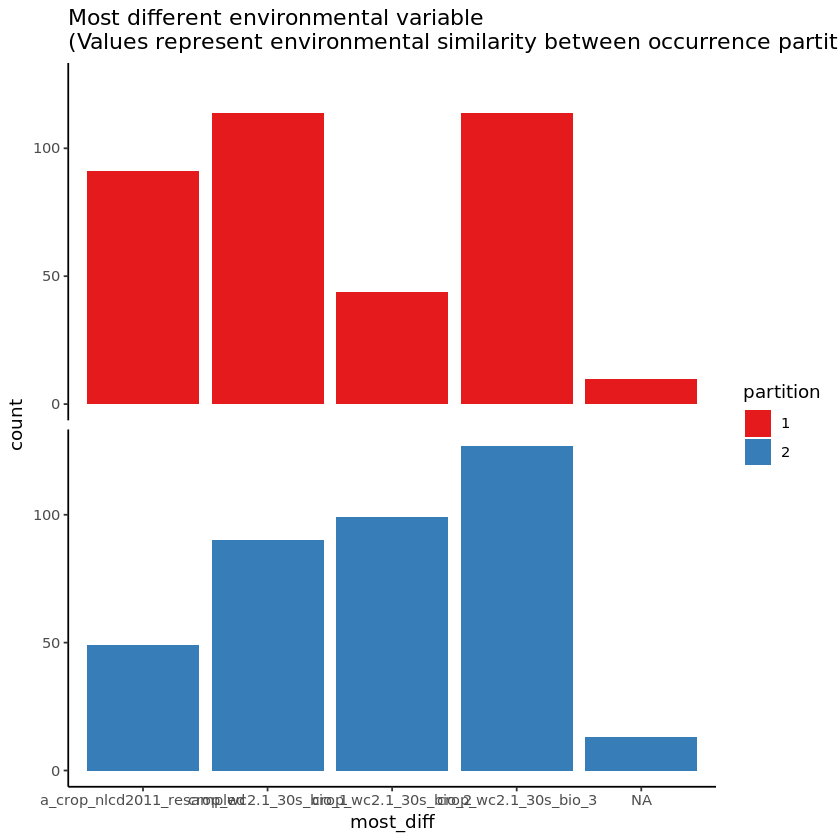

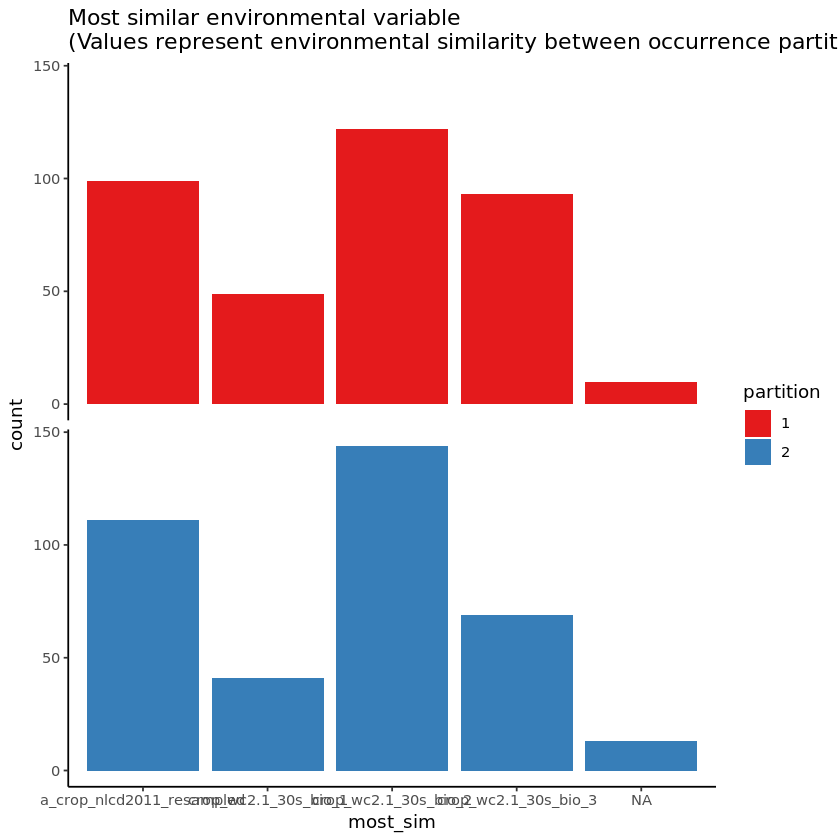

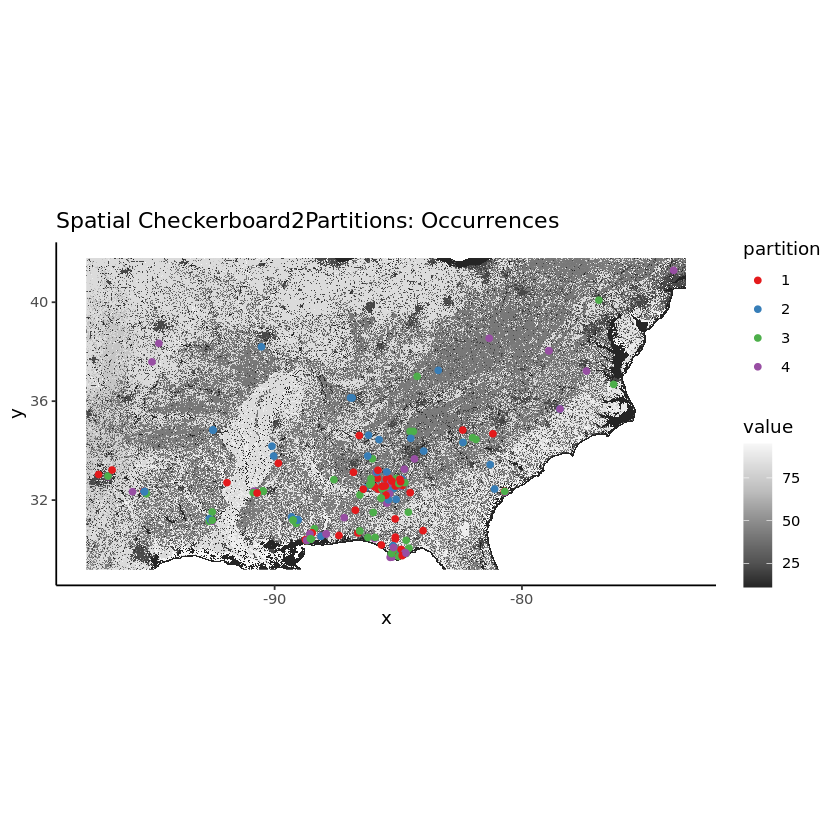

Warning message:
"Removed 87 rows containing non-finite values (stat_bin)."


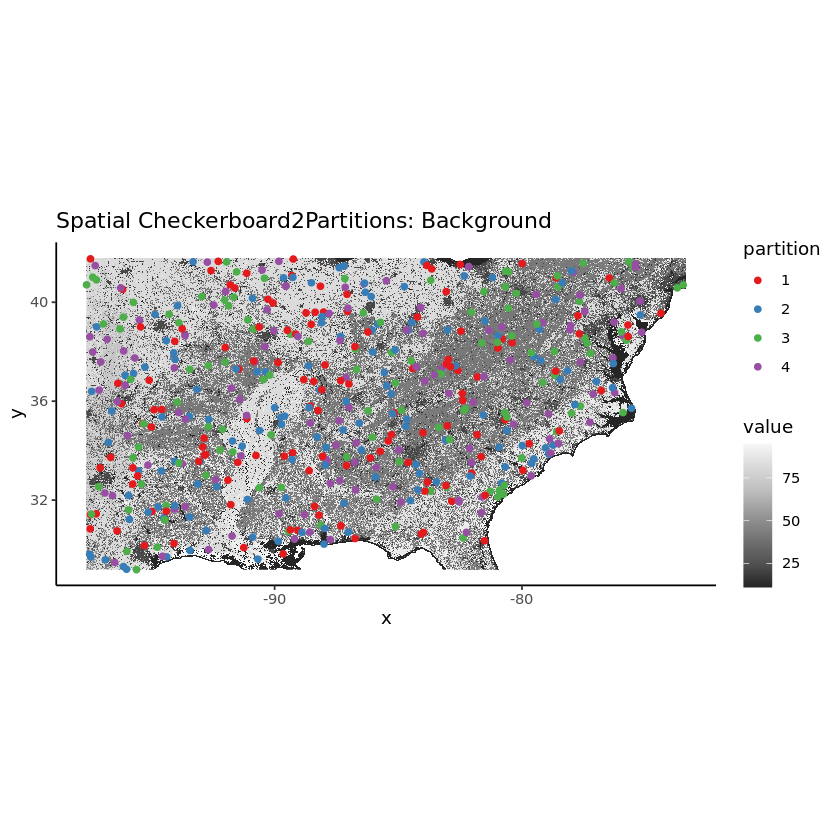

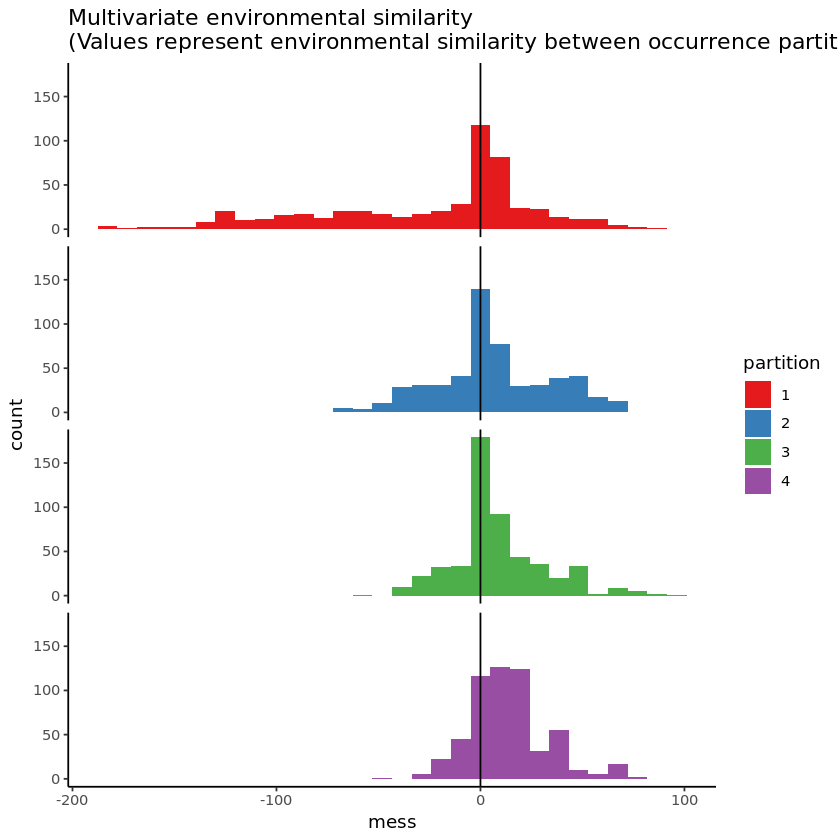

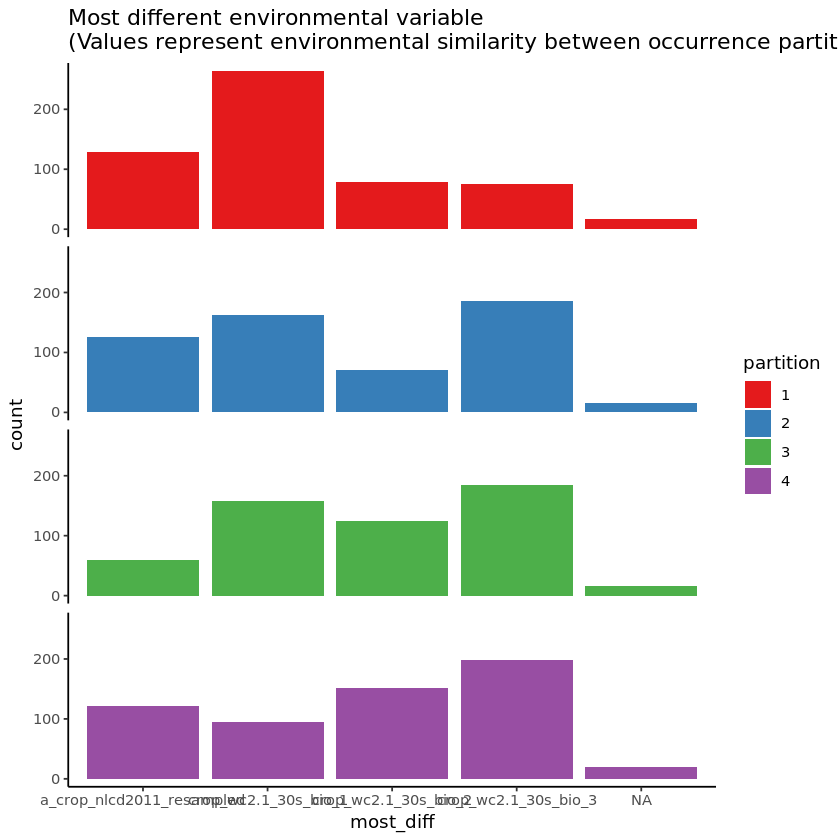


Done!


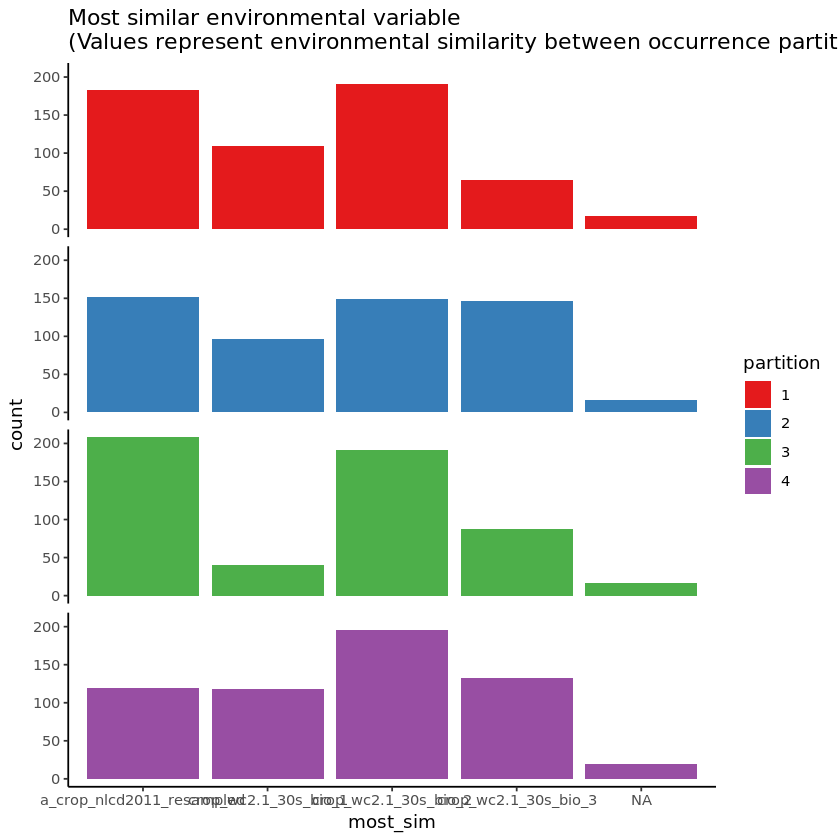

In [4]:
bg <- partition_raster_bg(env.list = envList,
                          plotDIR = plotDIR,
                          showPLOTS = TRUE,
                          number.bg.points=500
      )

You can see that the three different background methods are each different. Choose the one that best suits your study system. See the ENMeval documentation for more information.

### Allocate Memory to rJava

ENMeval requires rJava to work. rJava needs you to specify the amount of memory you are willing to allocate to it. Since I am working on a computer with 16GB RAM, I am going to allocate 4GB. Increase or decrease it based on your needs and/ or hardware.

In [10]:
options(java.parameters = "-Xmx4g")

### Run ENMeval

Now you can run ENMeval with our ```ruENMeval()``` function. You need to specify the background point method you want to use,  and you also need to specify if there are any categorical raster layers. To identify the categorical layers, you need to make a character vector with the layer names in it. You can get the layer names from the filename of your layer (without the extension).

In [11]:
# Run ENMeval.
# Adjust parameters as needed.
# See ENMeval vignette
eval.par <- runENMeval(env.list = envList,
                       bg = bg, 
                       parallel = TRUE, # Use multiple CPU cores?
                       categoricals = c("a_crop_nlcd2011_resampled"), # name of layer(s)
                       partition.method = "checkerboard1",
                       coords = coords, 
                       np = 2 # number of CPU cores you want to use if parallel=TRUE
            )

*** Running initial checks... ***


* Found 75979 raster cells that were NA for one or more, but not all, predictor variables. Converting these cells to NA for all predictor variables.

* Removed 55 occurrence localities that shared the same grid cell.

* Removed 27 background points with NA predictor variable values.

* Assigning variable a_crop_nlcd2011_resampled to categorical ...

* Clamping predictor variable rasters...

* Model evaluations with checkerboard (2-fold) cross validation...


*** Running ENMeval v2.0.0 with maxent.jar v3.4.1 from dismo package v1.3.3 ***




  |                                                                      |   0%


Of 4 total cores using 2...

Running in parallel using doSNOW...



  |======================================================================| 100%
This is MaxEnt version 3.4.1 
This is MaxEnt version 3.4.1 
This is MaxEnt version 3.4.1 
This is MaxEnt version 3.4.1 
This is MaxEnt version 3.4.1 
This is MaxEnt version 3.4.1 
This is MaxEnt version 3.4.1 
This is MaxEnt version 3.4.1 
This is MaxEnt version 3.4.1 
This is MaxEnt version 3.4.1 
This is MaxEnt version 3.4.1 
This is MaxEnt version 3.4.1 
This is MaxEnt version 3.4.1 
This is MaxEnt version 3.4.1 
This is MaxEnt version 3.4.1 
This is MaxEnt version 3.4.1 
This is MaxEnt version 3.4.1 
This is MaxEnt version 3.4.1 
This is MaxEnt version 3.4.1 
This is MaxEnt version 3.4.1 
This is MaxEnt version 3.4.1 
This is MaxEnt version 3.4.1 
This is MaxEnt version 3.4.1 
This is MaxEnt version 3.4.1 
This is MaxEnt version 3.4.1 
This is MaxEnt version 3.4.1 
This is MaxEnt version 3.4.1 
This is MaxEnt version 3.4.1 
This is MaxEnt version 3.4.1 
This is MaxEnt version 3.4.1 
This is MaxEnt versi

ENMevaluate completed in 22 minutes 37.7 seconds.



Once the analysis is done, we recommend saving it as an R object in case you need to restart the Jupyter Notebook (or if it crashes). Then you can easily reload it.

In [13]:
saveRDS(eval.par, file.path(dataDIR, "Robjects", "enm_eval_tutorial.rds"))

In [5]:
# Read the results in here by uncommenting the next line, if you need to.
eval.par <- readRDS(file = file.path(dataDIR, "Robjects", "enm_eval_tutorial.rds"))

### Summarize ENMeval Results

Now you can use our ```summarize_ENMeval()``` function to evaluate the results. You need to adjust the coordinate boundaries as needed using the ```minLat```, ```maxLat```, ```minLon```, and ```maxLon``` parameters. Let's look at the results from the ```runENMeval()``` function we ran above.

In [11]:
`%>%` <- dplyr::`%>%`
eval.par@results %>% head()

,fc,rm,tune.args,auc.train,cbi.train,auc.diff.avg,auc.diff.sd,auc.val.avg,auc.val.sd,cbi.val.avg,cbi.val.sd,or.10p.avg,or.10p.sd,or.mtp.avg,or.mtp.sd,AICc,delta.AICc,w.AIC,ncoef
,<fct>,<fct>,<fct>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
1,L,0.5,fc.L_rm.0.5,0.8414484,0.961,0.02680705,0.021111578,0.8223339,0.005154341,0.9305,0.017677670,0.1489583,0.069237539,0.02520833,0.020918576,5650.384,63.058123,1.685327e-14,16
2,LQ,0.5,fc.LQ_rm.0.5,0.8636903,0.976,0.03158638,0.008621023,0.8431159,0.018797187,0.9615,0.007778175,0.2104167,0.085442069,0.01520833,0.006776440,5591.426,4.099992,1.069743e-01,17
3,H,0.5,fc.H_rm.0.5,0.8848535,0.979,0.04312266,0.009102018,0.8521657,0.001735719,0.9600,0.022627417,0.1787500,0.012374369,0.03041667,0.013552880,5629.246,41.919783,6.558676e-10,47
4,LQH,0.5,fc.LQH_rm.0.5,0.8826854,0.981,0.04401122,0.002090292,0.8508022,0.002353645,0.9495,0.010606602,0.1787500,0.012374369,0.02520833,0.020918576,5606.567,19.241654,5.512002e-05,42
5,LQHP,0.5,fc.LQHP_rm.0.5,0.8834081,0.976,0.04434747,0.002128184,0.8512479,0.002671276,0.9540,0.019798990,0.1837500,0.005303301,0.02520833,0.020918576,5594.683,7.356910,2.099176e-02,39
6,LQHPT,0.5,fc.LQHPT_rm.0.5,0.9060491,0.992,0.06188085,0.001994085,0.8555158,0.001999579,0.9215,0.037476659,0.2197917,0.027989643,0.02541667,0.006481812,5674.148,86.822157,1.165171e-19,67


Now let's summarize the results to get the best model (determined by the delta.AICc score == 0) and get summaries of each of the relevant parameters.

The ```summarize_ENMeval()``` function will make a bunch of plots to help you choose the best model. See the ENMeval documentation. It will also display the predictions for each model. If you don't want to look at every single prediction, you can set which ones you want to look at with ```examine.predictions```. By default it looks at all of them. 

It also makes model plots for the various statistics in eval.par. By default, it looks at all the stats, but if you don't want all of them, you can use a character vector to supply the ones you do want. E.g., ```examine.stats = c("auc.val", "or.10p")```. See the ENMeval documentation for more information.

You also nneed to adjust the coordinate bounds for your dataset.

It will save all the plots in plotDIR, and if you set ```showPLOTS = TRUE```, it will print them to your screen or Jupyter Notebook.

```summarize_ENMeval()``` will make a bunch of plots and CSV files and save them in plotDIR, including the MAXENT precictions, lambda results, best model based on AICc scores, various plots showing how the regularization multipliers and feature classes affect AICc scores, model predictions, and a barplot showing raster layer Permutation Importance.  Many of the PDFs will have multiple plots, so scroll down to see them.  

If your raster filenames are long, they will likely run off the Permutation Importance barplot. You can adjust the margins of the plot using the ```imp.margins``` parameter. There are some other plot adjustment parameters you can try as well.

     [,1]
[1,]  0.7
[2,]  1.9
[3,]  3.1
[4,]  4.3


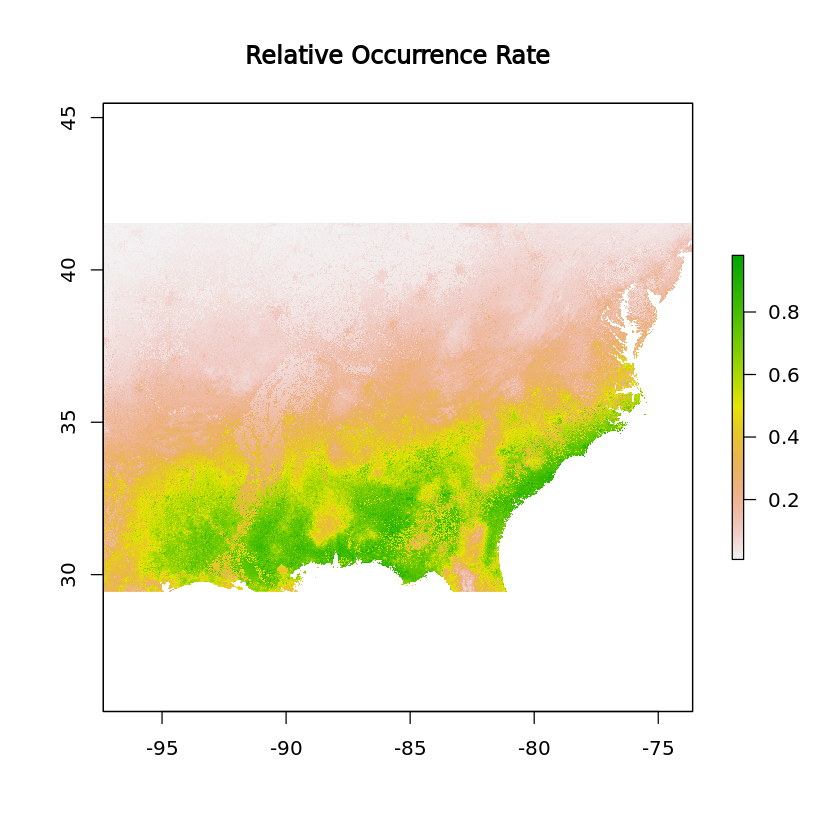

     [,1]
[1,]  0.7
[2,]  1.9
[3,]  3.1
[4,]  4.3


Building and evaluating null ENMs with 100 iterations...



  |                                                                      |   0%This is MaxEnt version 3.4.1 
This is MaxEnt version 3.4.1 
This is MaxEnt version 3.4.1 
This is MaxEnt version 3.4.1 
This is MaxEnt version 3.4.1 
This is MaxEnt version 3.4.1 
This is MaxEnt version 3.4.1 
This is MaxEnt version 3.4.1 
This is MaxEnt version 3.4.1 
This is MaxEnt version 3.4.1 
This is MaxEnt version 3.4.1 
This is MaxEnt version 3.4.1 
This is MaxEnt version 3.4.1 
This is MaxEnt version 3.4.1 
This is MaxEnt version 3.4.1 
  |=                                                                     |   1%This is MaxEnt version 3.4.1 
This is MaxEnt version 3.4.1 
This is MaxEnt version 3.4.1 
This is MaxEnt version 3.4.1 
This is MaxEnt version 3.4.1 
This is MaxEnt version 3.4.1 
This is MaxEnt version 3.4.1 
This is MaxEnt version 3.4.1 
This is MaxEnt version 3.4.1 
This is MaxEnt version 3.4.1 
This is MaxEnt version 3.4.1 
This is MaxEnt version 3.4.1 
This is MaxEnt version 3.4.1 
Th


ENMnulls completed in 0 minutes 43.8 seconds.

`stat_bin()` using `bins = 30`. Pick better value with `binwidth`.



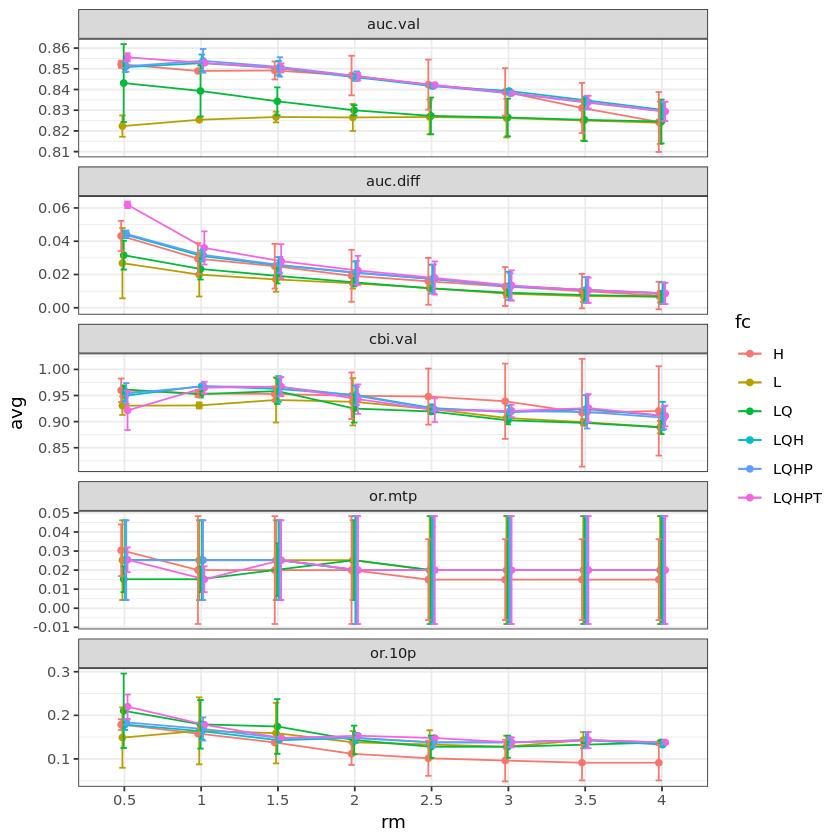

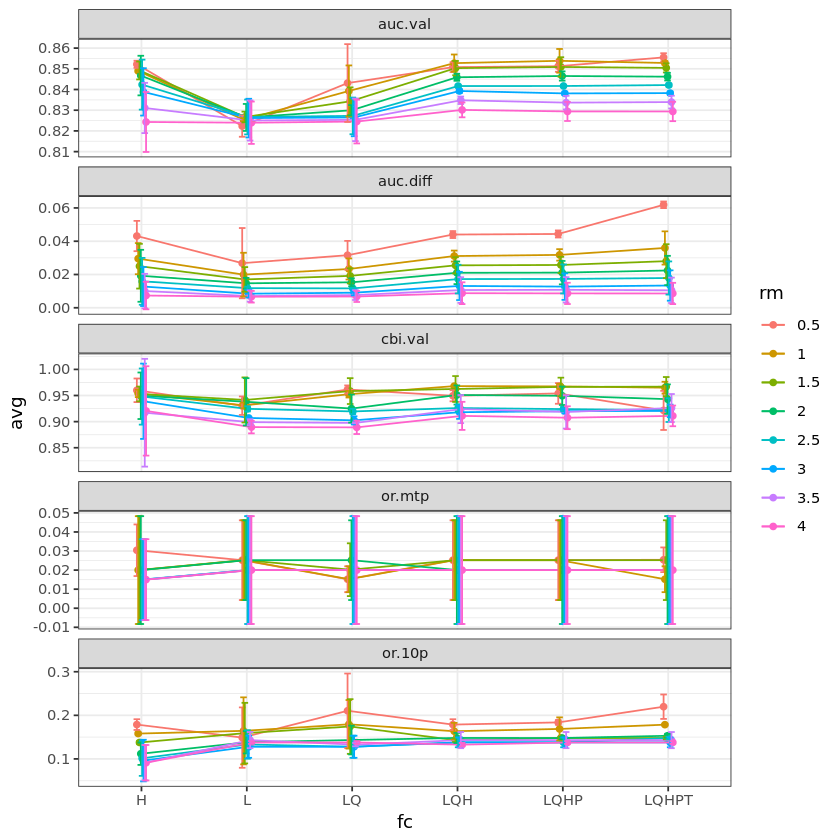

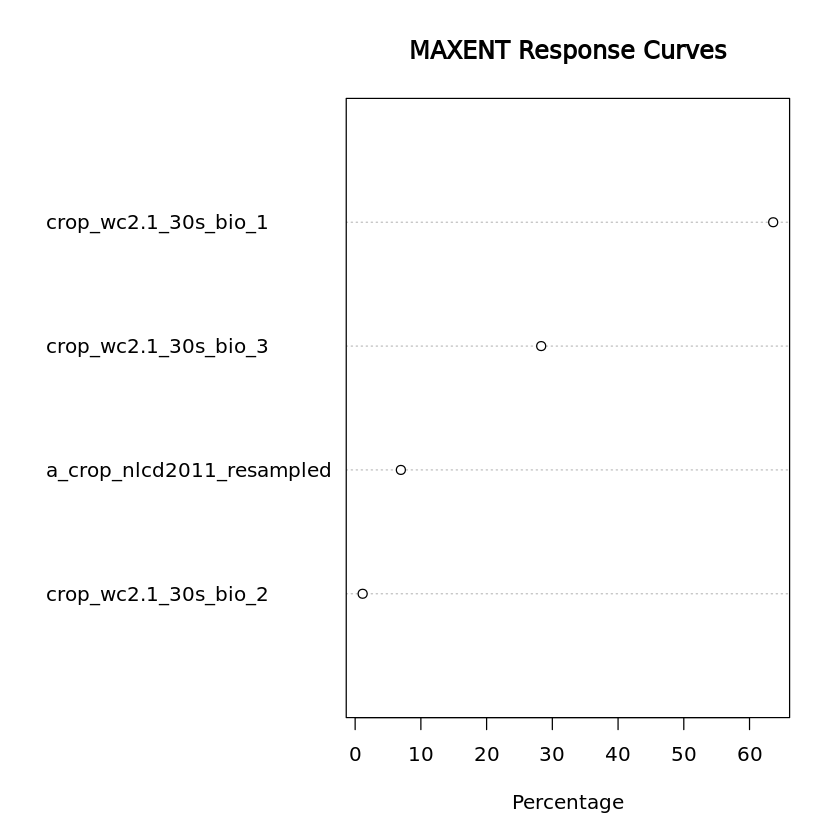

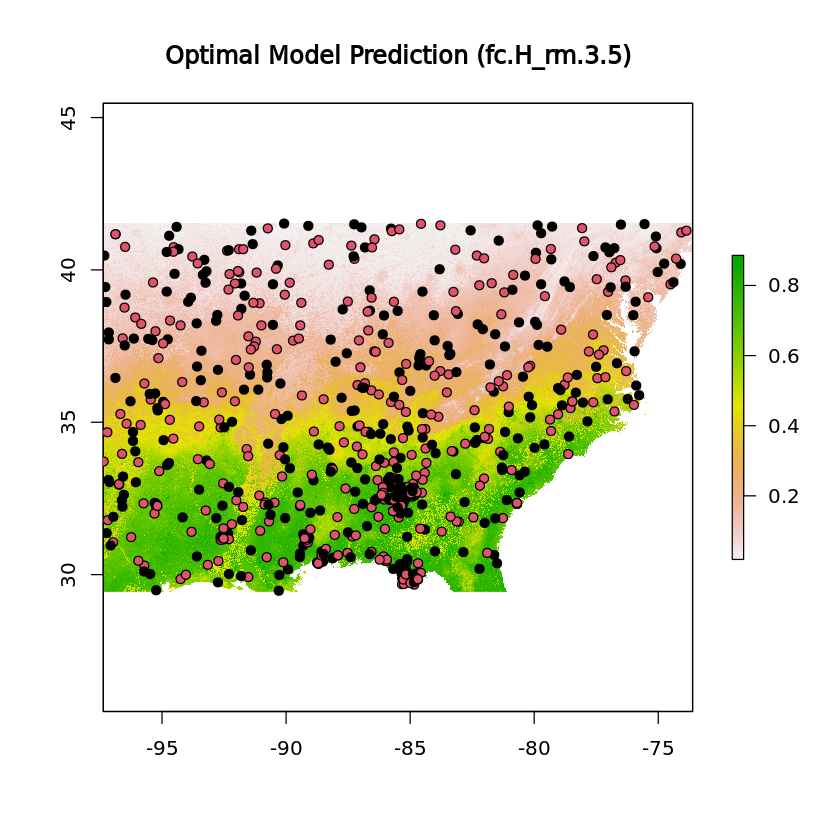

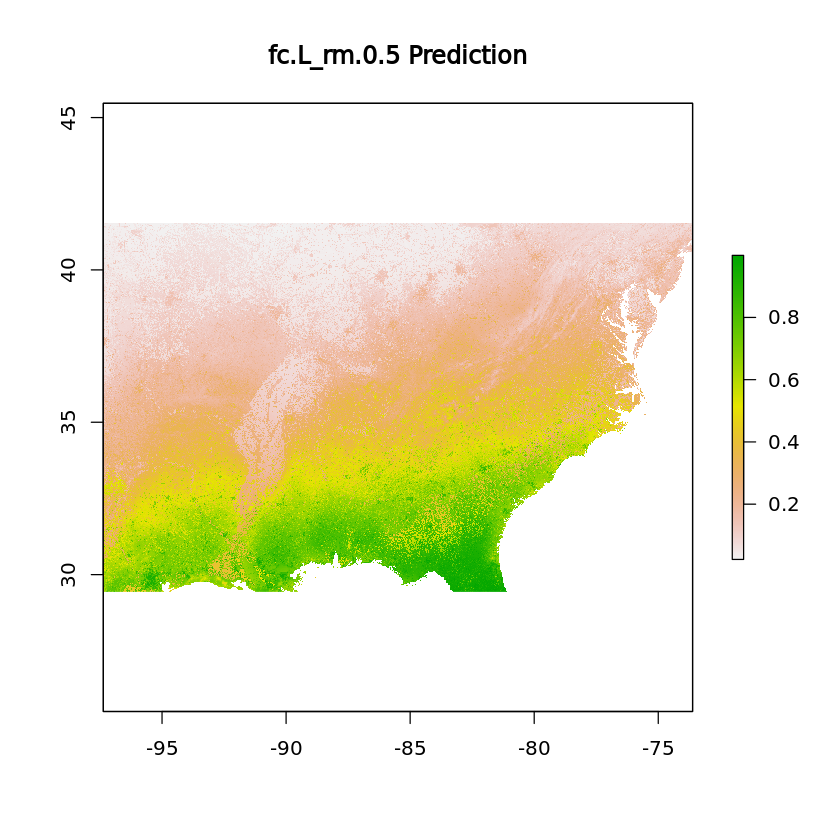

...

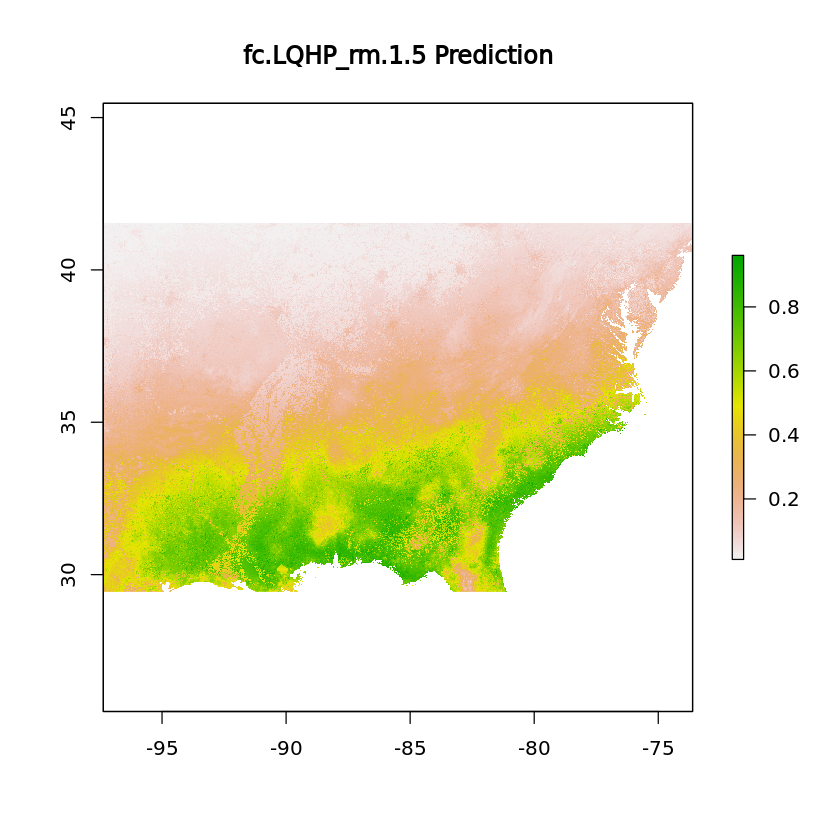

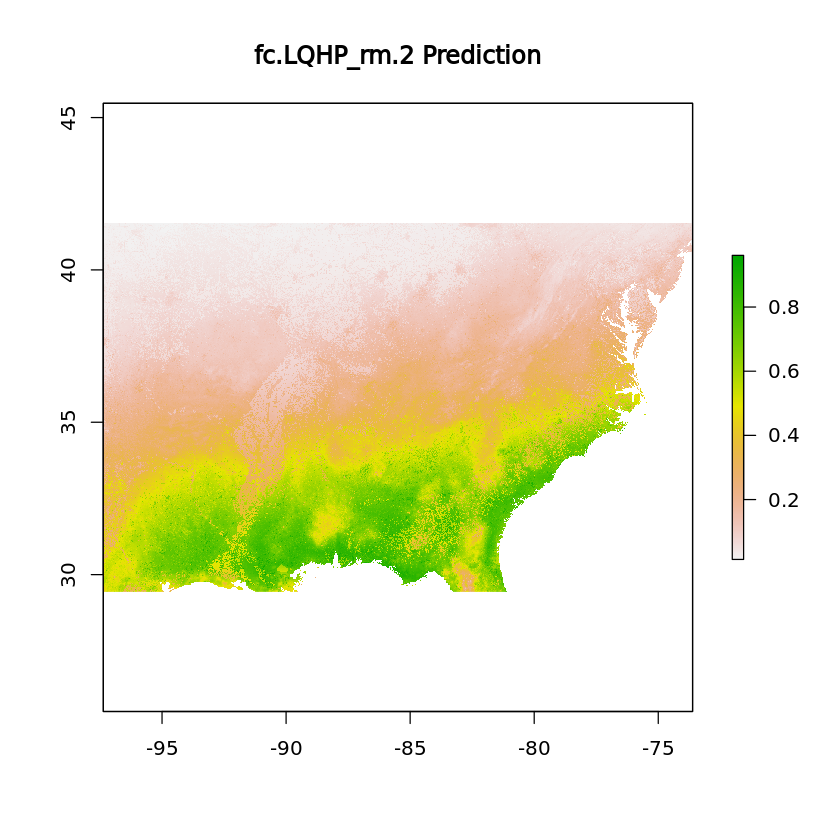

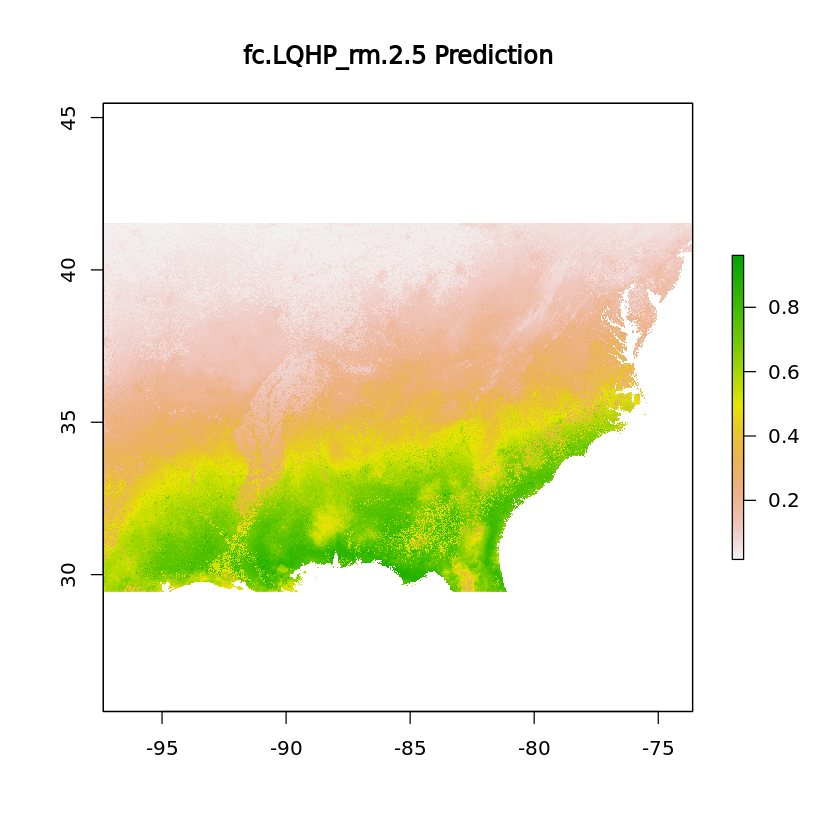

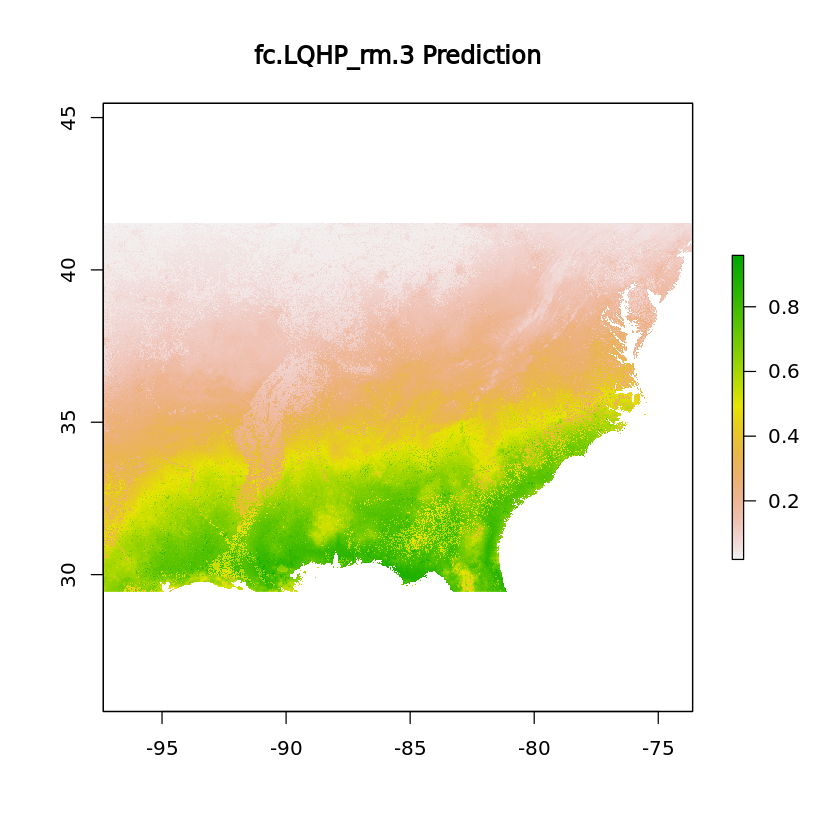

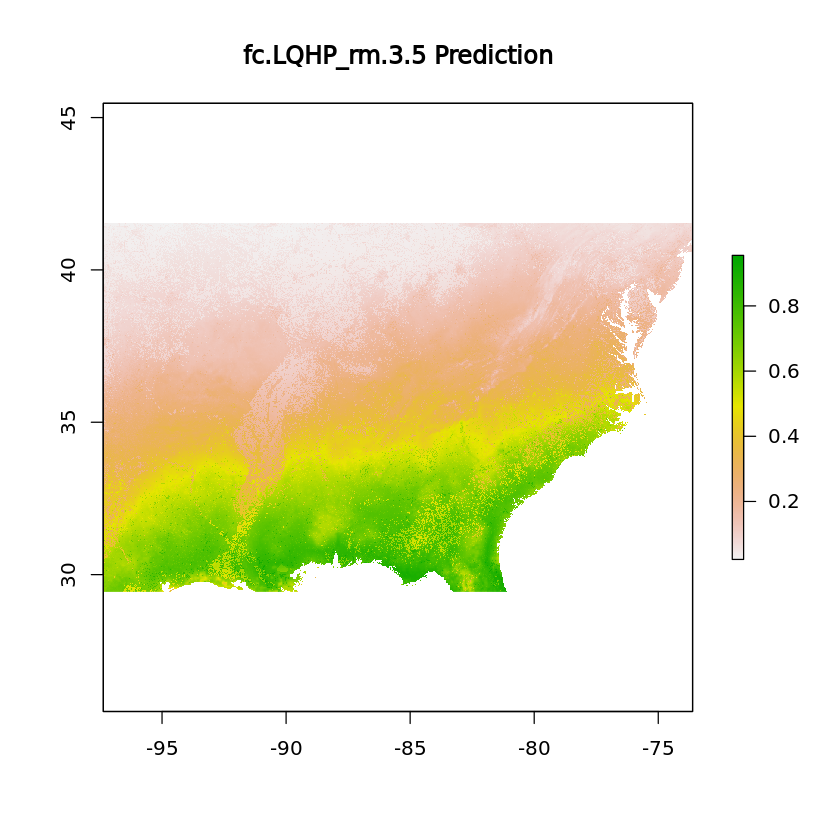

`stat_bin()` using `bins = 30`. Pick better value with `binwidth`.



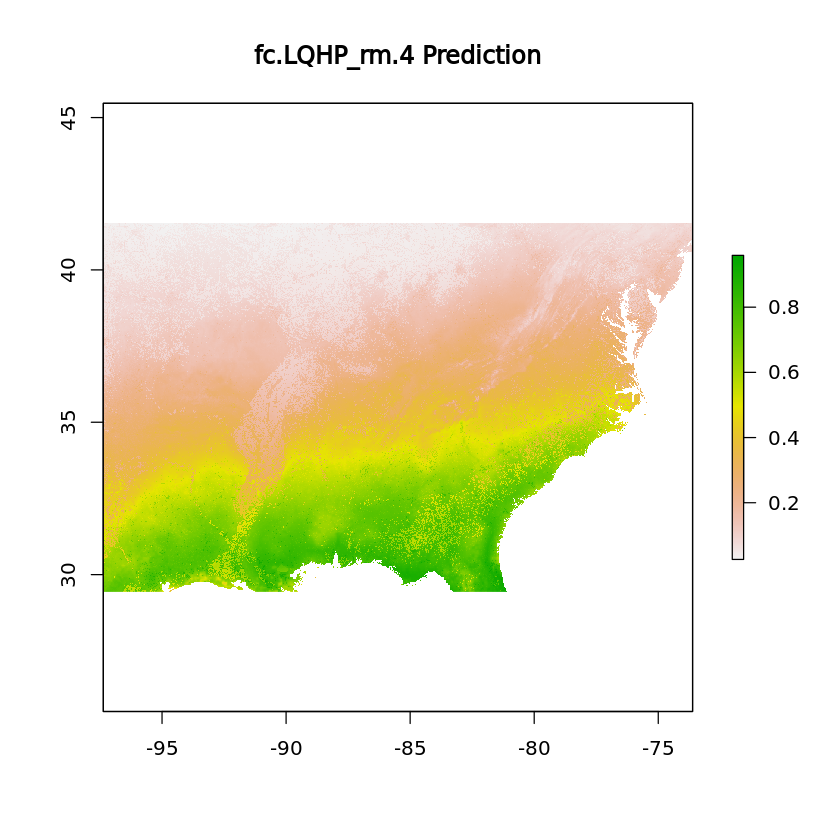

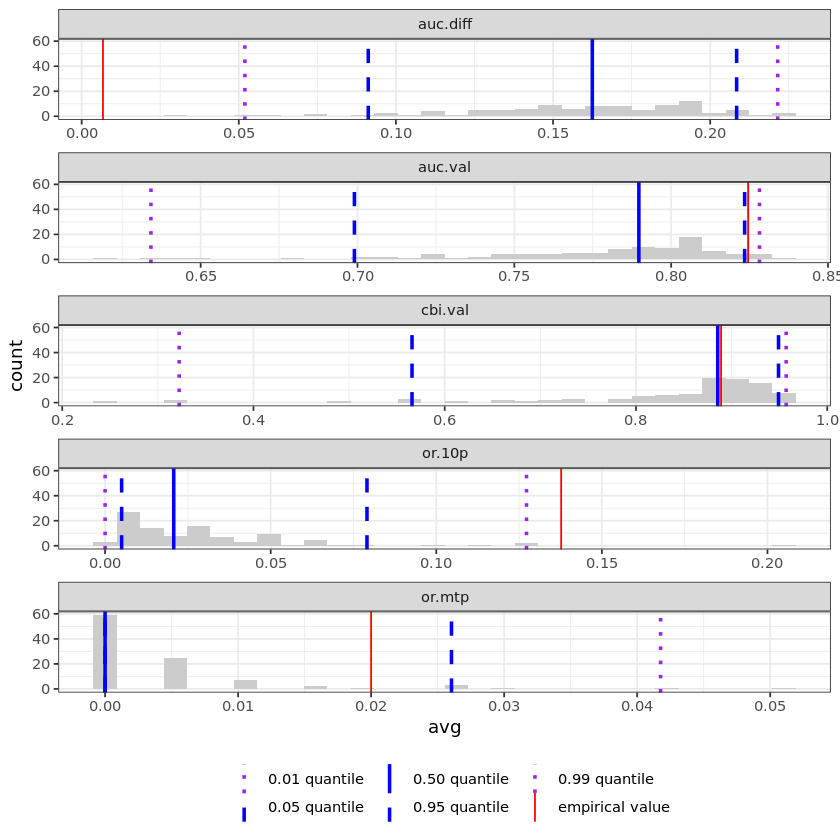

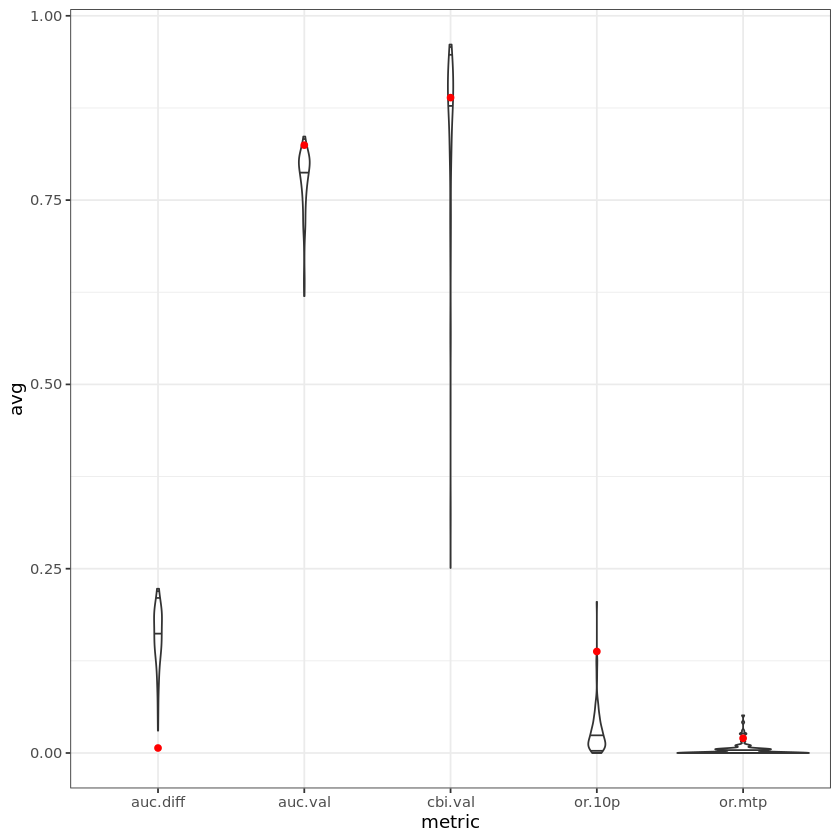

In [7]:
# Adjust coordinate bounds as needed.
summarize_ENMeval(
  eval.par = eval.par,
  plotDIR = plotDIR,
  showPLOTS = TRUE,
  minLat = 25,
  maxLat = 45,
  minLon = -100,
  maxLon = -45,
  imp.margins = c(15.1, 4.1, 3.1, 2.1),
  examine.predictions = c("L", "LQ", "LQHP")
)

Note that a real analysis would include far more background points and all the layers. 

### Choose the Most Important Layers

One way you can decide on the most important layers is by using the permutation importance, which is one of the plots that ```summarize_ENMeval()``` makes.

Here is the example from the full analysis.

<img src="img/permutationImportance_plot.png" width="60%">


You can see that two of the layers were by far the most important (BioClim layer 7 and mean annual solar radition). 

### Run Introgress 

Now we run INTROGRESS. To do so, we need the INTROGRESS input files (see ?introgress). We have included a ClineHelpR function to generate the INTROGRESS input files from a genind object, which can be created in adegenet. See ?adegenet. 

We have included a wrapper function to run INTROGRESS more simply. You can adjust the paramters. Make sure to remove individuals from the INTROGRESS input files that occurred on NA raster values.

We have supplied a ```runIntrogress()``` function to simplify running it. First though, you need to get the sample data and rasters ready. To do so, you can use our ```extractPointValues()``` function along with the envList object from above to extract raster values from each of the sample points.

In [21]:
rasterDIR <- "../data/exampleData/ENMeval_bioclim/rasterLayers/subset/"
dataDIR <- "../data/exampleData/introgress"

rasterPoint.list <- extractPointValues(envList)

# Save them to file. Create directory if it doesn't already exist.
dir.create(file.path(dataDIR, "extractedRasterValues"), showWarnings = FALSE)

# Write them to file for each raster layer.
for (i in 1:length(rasterPoint.list)) {
  write.table(
    rasterPoint.list[[i]],
    file.path(
      dataDIR,
      "extractedRasterValues",
      paste0("rasterPoints_tutorial",
             colnames(rasterPoint.list[[i]][4]),
             ".csv")
    ),
    quote = FALSE,
    row.names = FALSE,
    col.names = TRUE,
    sep = ","
  )
}


Extracting raster values at sample points

Adding sampleIDs to raster dataframe


Now you can run INTROGRESS!

#### Convert genind to Introgress Format

The input data must be converted to the custom INTROGRESS file format. ClineHelpR provides three different ways to convert standard file formats INTROGRESS format. 

ClineHelpR includes a function, ```genind2introgress()``` that converts a genind object to the custom INTROGRESS input format. It also performs per-individual and per-site missing data filtering at a user-specified threshold and removes non-biallelic sites.

Let's demonstrate its usage. First, we have to convert the input data to a genind object. There are numerous ways to do so, but we will use the ```read.structure()``` function in the ```adegenet``` R package. The genind object needs a population column. It's a pretty standard requirement, but if you don't already have that you can create one programatically with my *str2popmap.py* script here: https://github.com/btmartin721/makePopMap

Once you have that, you can load the STRUCTURE-formatted file into a genind object.

In [37]:
# Load adegenet R package to get read.structure() function
library("adegenet")

# Read a STRUCTURE file to a genind object.
genind <- read.structure(file = "../data/exampleData/bgc/bgc_structureFiles/eatt.str", n.ind = 101, n.loc = 233, onerowperind = FALSE, col.lab = 1, col.pop = 2, row.marknames = 1, NA.char = -9)

head(genind[,1:5]) # print the genind object for first few loci and alleles.


 Which other optional columns should be read (press 'return' when done)? 
 Converting data from a STRUCTURE .stru file to a genind object... 



/// GENIND OBJECT /////////

 // 1 individual; 3 loci; 5 alleles; size: 6.2 Kb

 // Basic content
   @tab:  1 x 5 matrix of allele counts
   @loc.n.all: number of alleles per locus (range: 1-2)
   @loc.fac: locus factor for the 5 columns of @tab
   @all.names: list of allele names for each locus
   @ploidy: ploidy of each individual  (range: 2-2)
   @type:  codom
   @call: .local(x = x, i = i, j = j, drop = drop)

 // Optional content
   @pop: population of each individual (group size range: 1-1)

#### genind2introgress()

Now let's convert the genind object to introgress format. It will write each of the relevant files to disk ```outputDIR```. You also have to specify the population IDs for each of the p1, p2, and admixed populations. NOTE: The admix population can be a character vector. E.g., ```admix=c("1", "4")```.

In [50]:
genind2introgress(gen = genind, p1 = "2", p2 = "3", admix = "1", missingPerLoc = 0.4, missingPerInd = 0.55, prefix=file.path(plotDIR, "eatt"))

[1] "Writing outputs with prefix: ./plots/eatt"


Let's look at the p1 file.

In [51]:
head(read.table(file = file.path(plotDIR, "eatt_p1data.csv"), header = FALSE, sep="\t"))

,V1,V2,V3,V4,V5,V6,V7,V8
,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>
1,NA/NA,02/02,02/02,NA/NA,NA/NA,02/02,02/02,NA/NA
2,02/02,02/02,NA/NA,02/02,02/02,02/02,02/02,02/02
3,03/03,03/03,NA/NA,03/03,03/03,03/03,03/03,03/03
4,04/04,04/04,04/04,NA/NA,04/04,04/04,04/04,04/04
5,03/03,03/03,NA/NA,03/03,03/03,NA/NA,NA/NA,03/03
6,NA/NA,01/01,01/01,NA/NA,NA/NA,01/03,01/01,NA/NA


And the loci file.

In [52]:
# loci file
head(read.table(file = file.path(plotDIR, "eatt_loci.txt"), header = FALSE, sep = "\t"))
ncol(read.table(file = file.path(plotDIR, "eatt_admix.txt"), header = FALSE, sep = "\t"))

,V1,V2
,<chr>,<chr>
1,locus,type
2,SNP_1,C
3,SNP_2,C
4,SNP_3,C
5,SNP_4,C
6,SNP_5,C


[1] 85

#### Running INTROGRESS

Now let's run INTROGRESS. You need to specify each of the INTROGRESS input files: ```*_p1data.csv```, ```*_p2data.csv```, ```*_admix.csv```, and ```*_loci.txt```.

So, you need the P1, P2, admixed, and loci files. The above command will run both the perumtation and parametric INTROGRESSION tests. See ?introgress.

You can also change the field separated in the INTROGRESS input files by using sep. E.g.,  
```sep = ","```. You can set clineLabels to reflect your population names. It needs to be a character vector of length == 3.  

You can set the minDelt parameter to a different value if you want. This parameter only tests outlier loci that have allele frequency differentials (deltas) > minDelt. So ideally this should be set high (>0.6). You can try different settings. Default is 0.8. If you don't recover any loci, lower minDelt.  

If your SNPs are fixed between parental populations, set fixed = TRUE and it will also generate a triangle plot of Interspecific Heterozygosity ~ Hybrid Index. But if you have next-gen sequence data, you most likely don't have fixed SNPs.  

pop.id and ind.id are used if your input files have these headers.  

Once this finishes running, you can use another ClineHelpR function, ```subsetIndividuals()```, to subset a full list of individuals to just those included in the INTROGRESS analysis (i.e., if you are only using a subset of populations). It needs to be used in an lapply like below:

In [53]:
eatt <- runIntrogress(
  p1.file = file.path(plotDIR, "eatt_p1data.txt"),
  p2.file = file.path(plotDIR, "eatt_p2data.txt"),
  admix.file = file.path(plotDIR, "eatt_admix.txt"),
  loci.file = file.path(plotDIR, "eatt_loci.txt"),
  clineLabels = c("EA", "Het", "TT"),
  minDelt = 0.8,
  prefix = "EATT",
  outputDIR = plotDIR,
  sep = "\t",
  fixed = FALSE,
  pop.id = FALSE,
  ind.id = FALSE
)

prepare.data is working; this may take a moment
Processing data for 85 individuals and 191 loci.
est.h is working; this may take a few minutes
genomic.clines is working; be patient, as this may take a while 
begining analysis. 
estimating genomic cline for: SNP_2 
estimating genomic cline for: SNP_3 
estimating genomic cline for: SNP_11 
estimating genomic cline for: SNP_18 
estimating genomic cline for: SNP_84 
genomic clines analysis complete! 
genomic.clines is working; be patient, as this may take a while 
begining analysis. 
estimating genomic cline for: SNP_2 
estimating genomic cline for: SNP_3 
estimating genomic cline for: SNP_11 
estimating genomic cline for: SNP_18 
estimating genomic cline for: SNP_84 
genomic clines analysis complete! 


In [54]:
# Save the INTROGRESS object
saveRDS(eatt, file = file.path(plotDIR, "eatt_introgress_tutorial.rds"))

### Clines X Environment

Now let's use the output from ```runIntrogress()``` to correlate clines with environmental variables!

Let's use our function ```subsetIndividuals()``` to remove individuals that fell in NA raster values. It also removes individuals from the raster data that are not found in the INTROGRESS output. For example, if you had used a subset of populations for INTROGRESS.

In [57]:
# Subset individuals for only the populations I want
# This was done because the locality data has more individuals
# than were used for introgress
rasterPoint.list.subset <-
  lapply(rasterPoint.list,
         subsetIndividuals,
         file.path(dataDIR, "inputFiles", "eatt_inds.txt"))

You'll also need to put all your individuals you are using in the analysis in a file. In this case, we are using ```eatt_inds.txt```. The file is basically just a one-column file with individual IDs you want to keep, in the same order as the population map file.

Let's look at it.

In [58]:
head(read.table(file.path(dataDIR, "inputFiles", "eatt_inds.txt")))

,V1
,<chr>
1,EAAL_BX1380
2,EAAL_BX1387
3,EAAL_BX211
4,EAAL_BXEA27
5,EAGA_BX217
6,EAGA_BX219


#### Run clinesXenvironment

You can change the clineMethod to either "permutation" or "parametric". See ?introgress.  

This will run for latitude, longitude, and all the raster layers from envList. If you want to run it for only some raster layers, just use the rastersToUse parameter, which is just an integer vector containing the indexes for each raster layer you want to include. You can get which raster is which by inspecting the envList[[1]]@data object.  

You can also change the correlation method parameter (cor.method) to something else supported by cor.test. Possible options include:  
```c("auto", "pearson", "kendall", "spearman")```

If you use auto, it will test for normally distributed data and, if present, will use Pearson's correlation. If not, it will use Kendall. But if you want to use Spearman's, you need to change the cor.method parameter to "spearman".  

clinesXenvironment will generate three output files:  

1. "prefix_clinesXLatLon.pdf", which contains:
  + Genomic Clines ~ Latitude and Longitude
  + Hybrid Index ~ Latitude and Longitude
  
2. "prefix_clinesXenv.pdf", which contains:
  + Genomic Clines ~ each raster layer
  + Hybrid Index ~ each raster layer
  
3. "prefix_corrSummary.csv"
  + This contains correlation tests for all the environmental files, plus latitude and longitude.

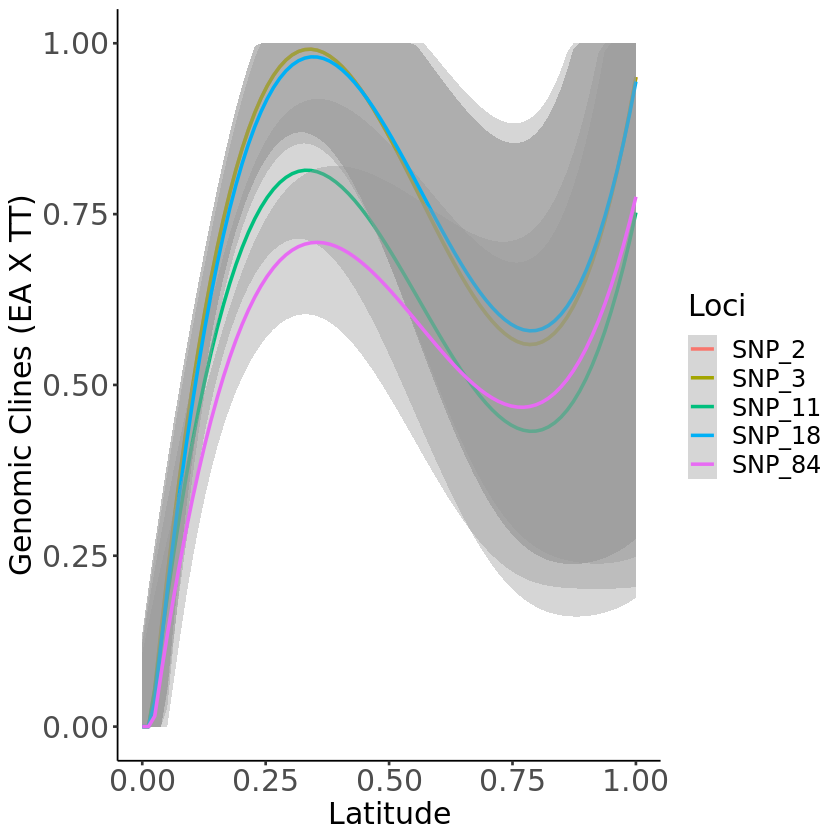

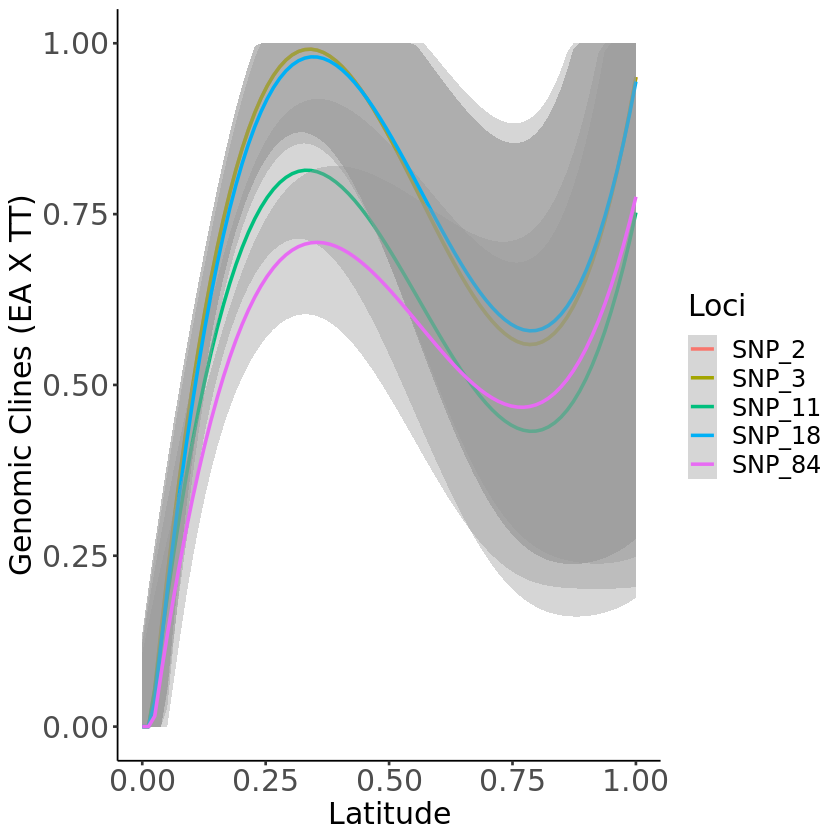

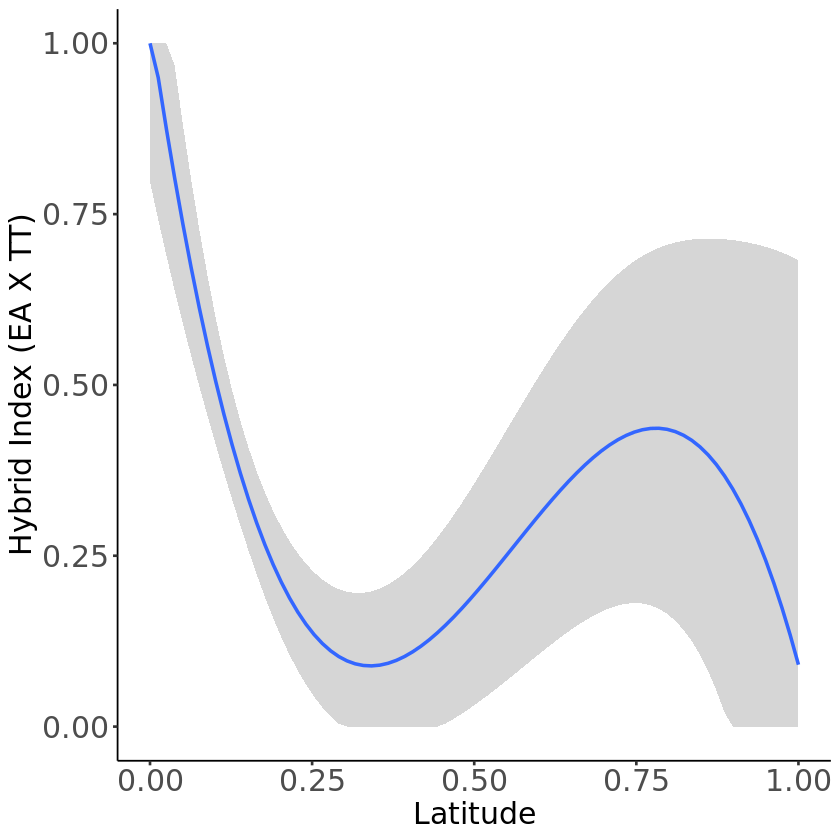

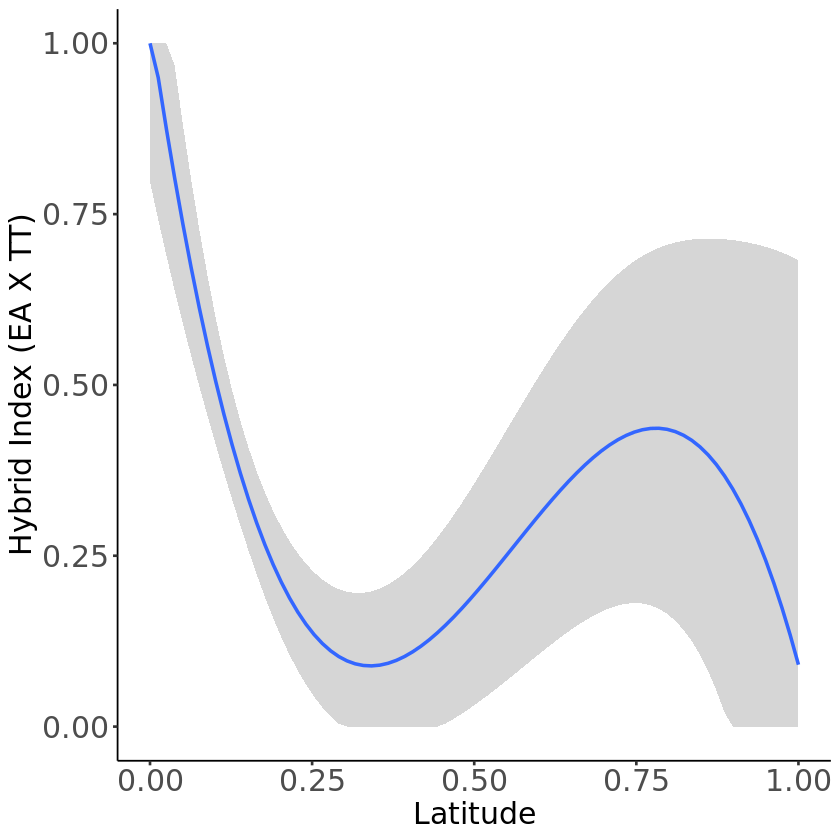

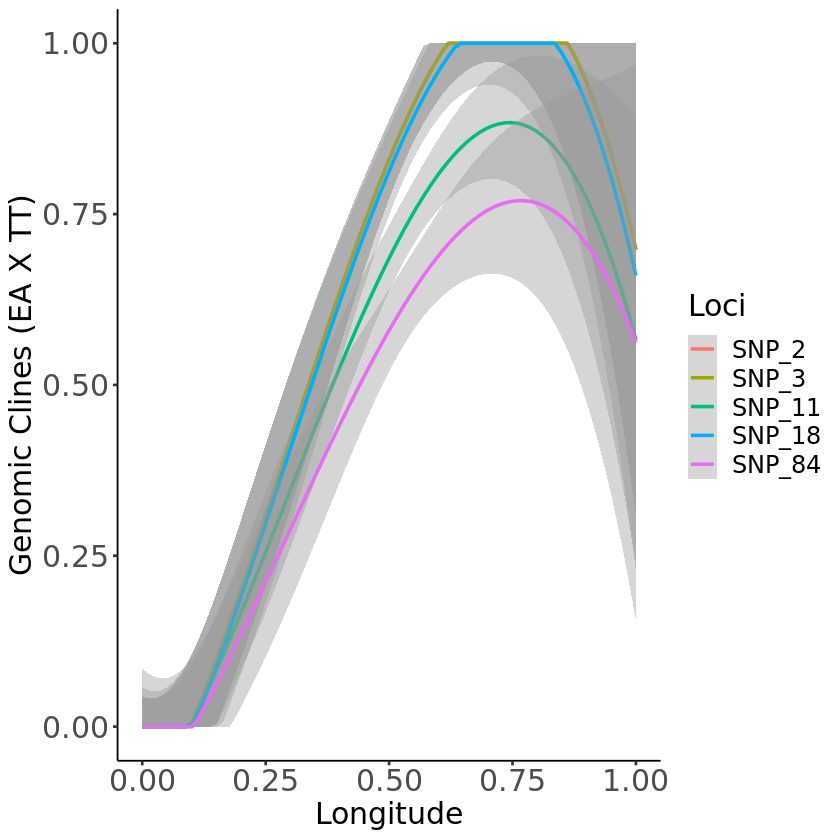

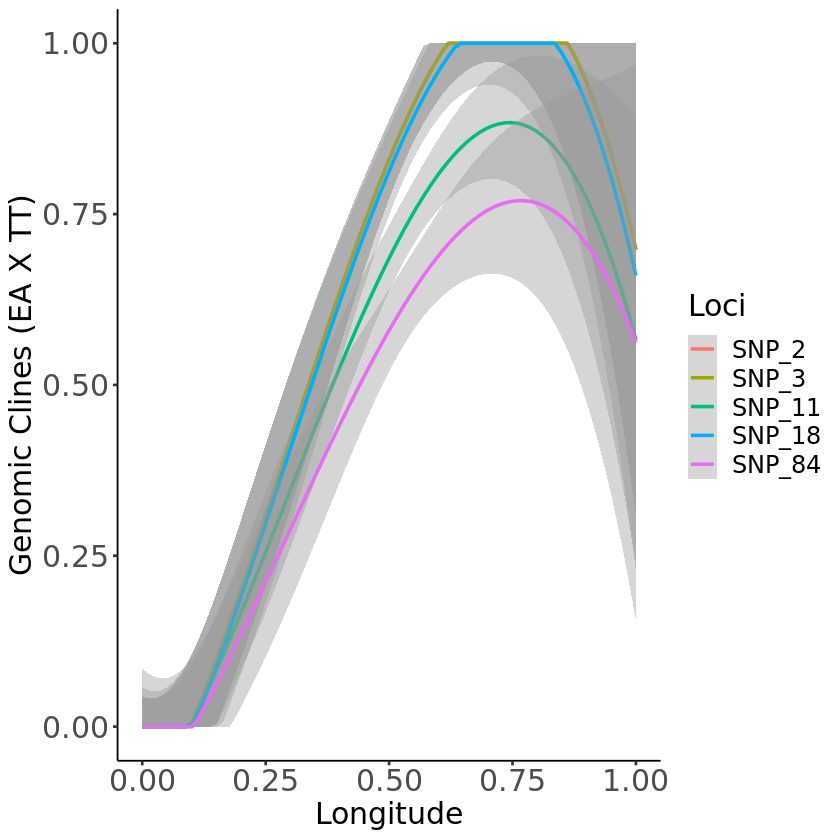

Warning message in cor.test.default(env, hi, method = cor.method):
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(env, hi, method = cor.method):
"Cannot compute exact p-value with ties"


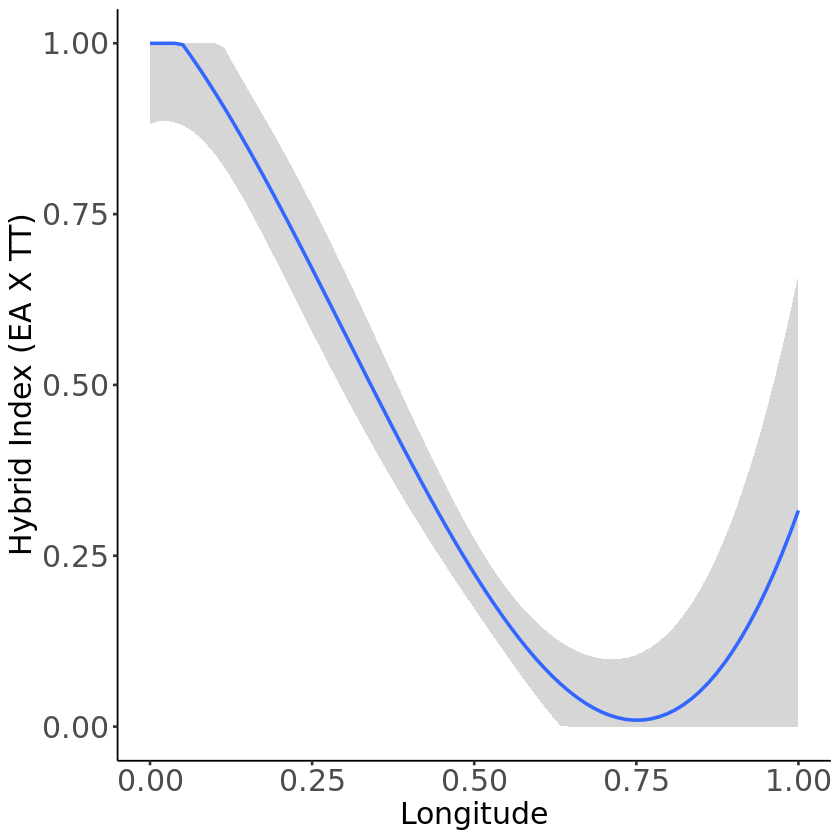

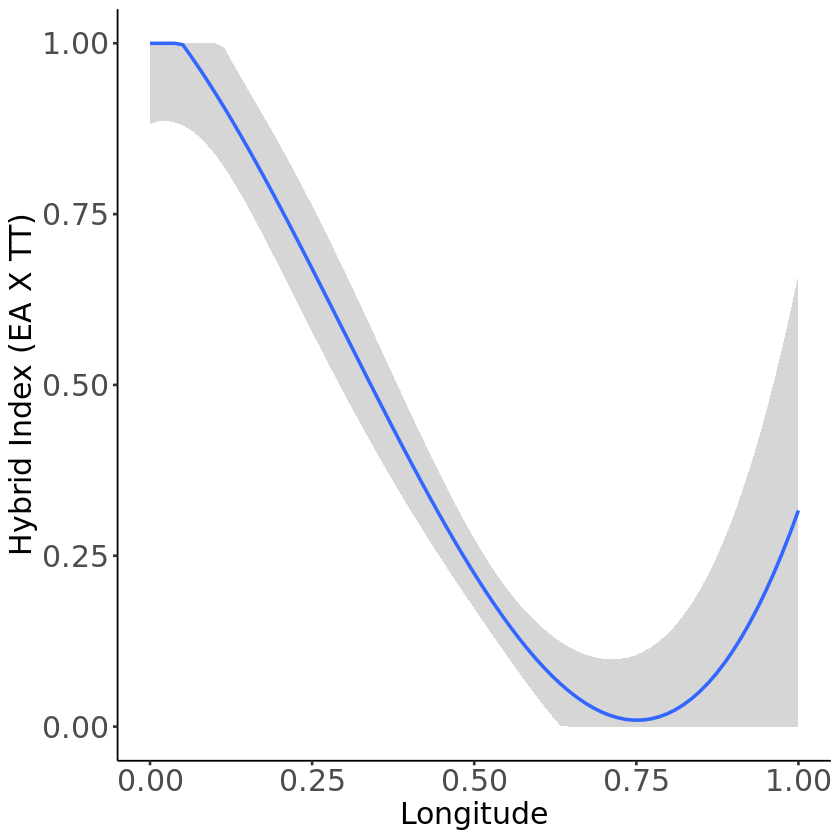

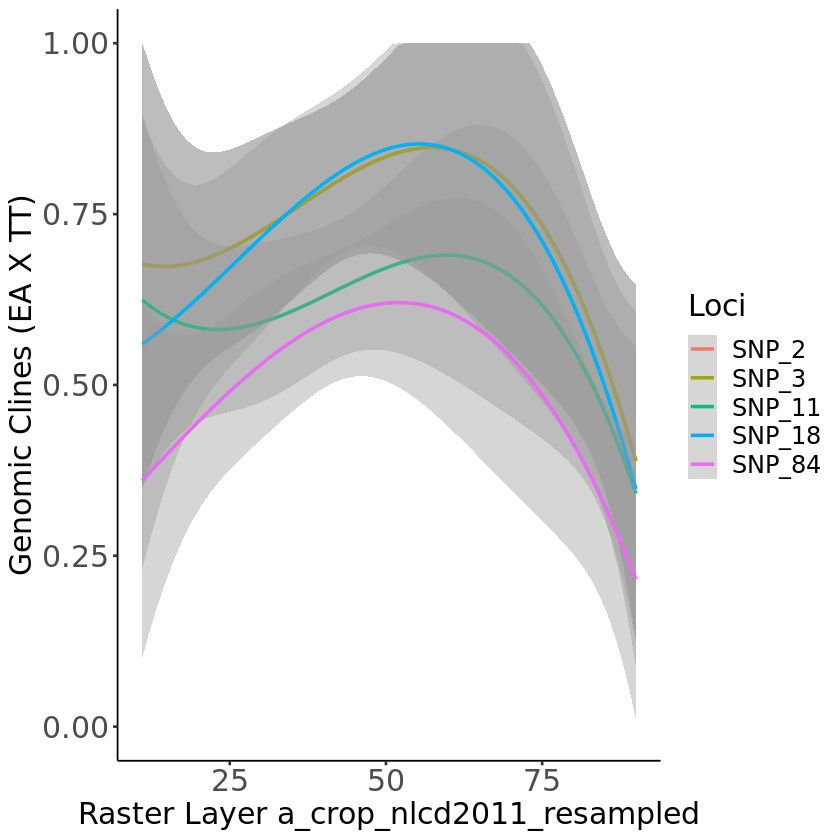

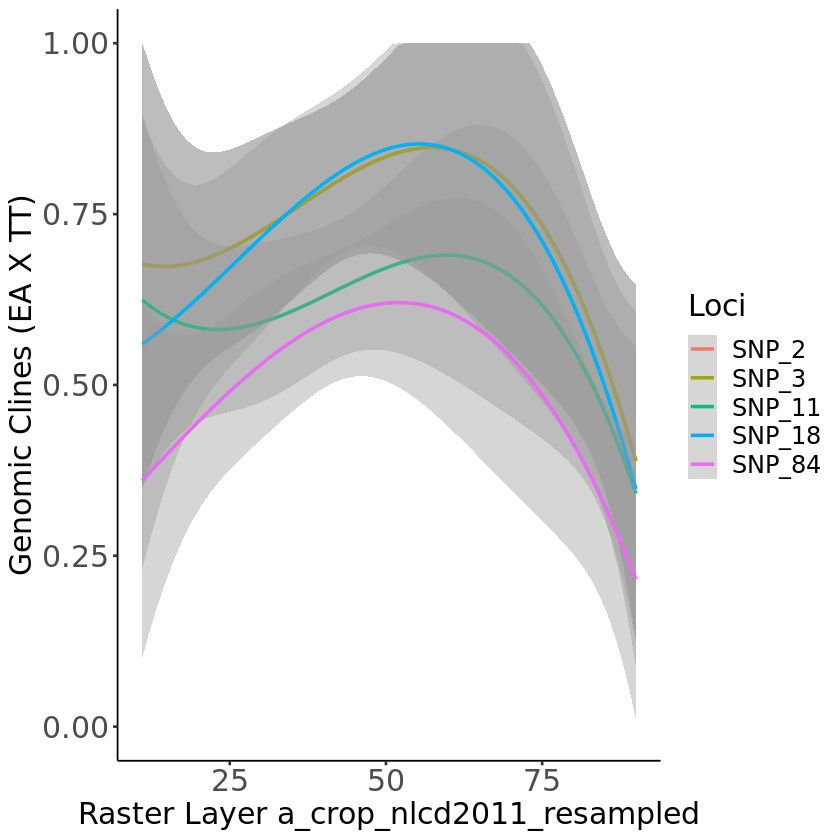

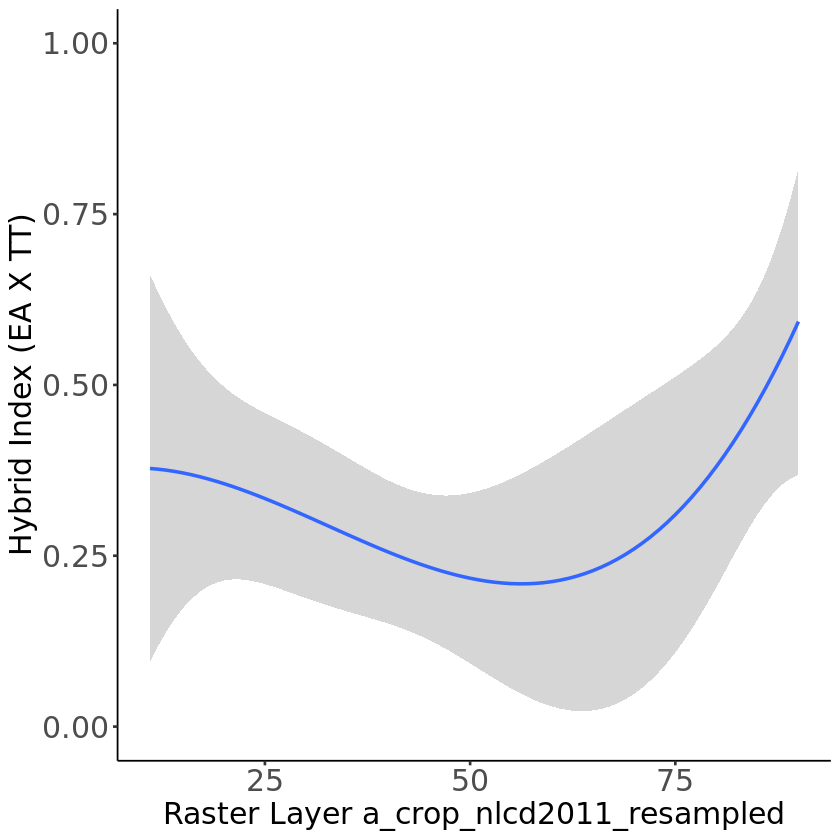

...

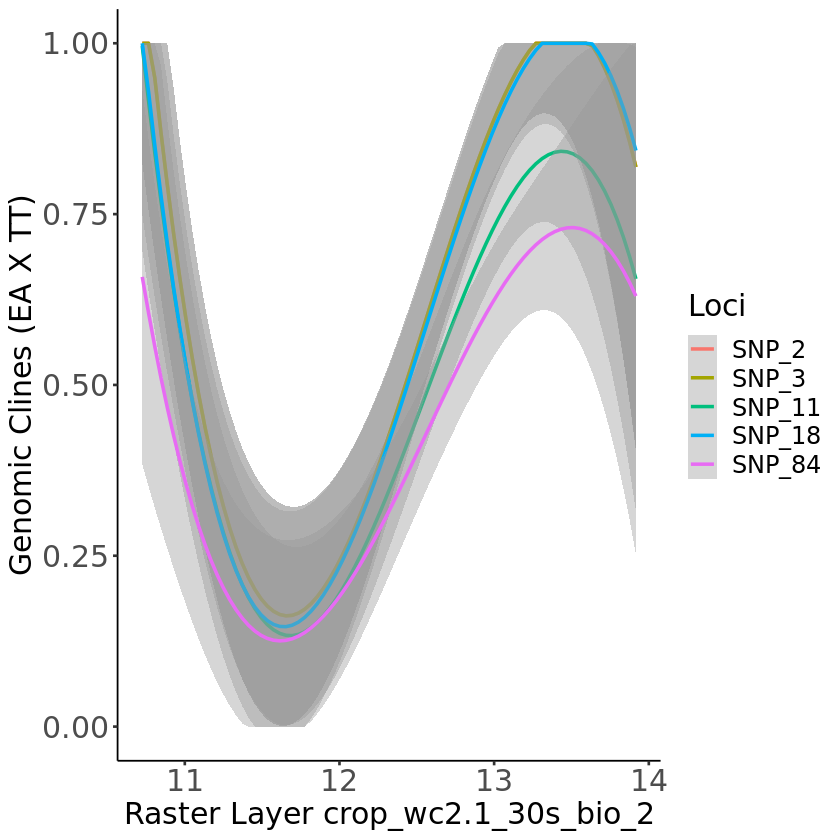

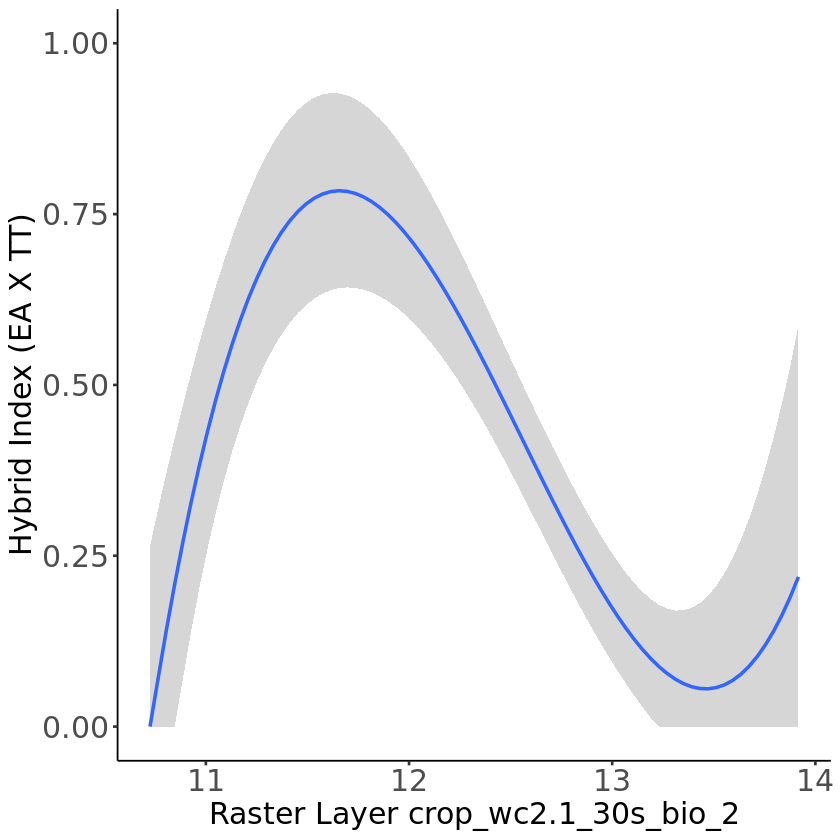

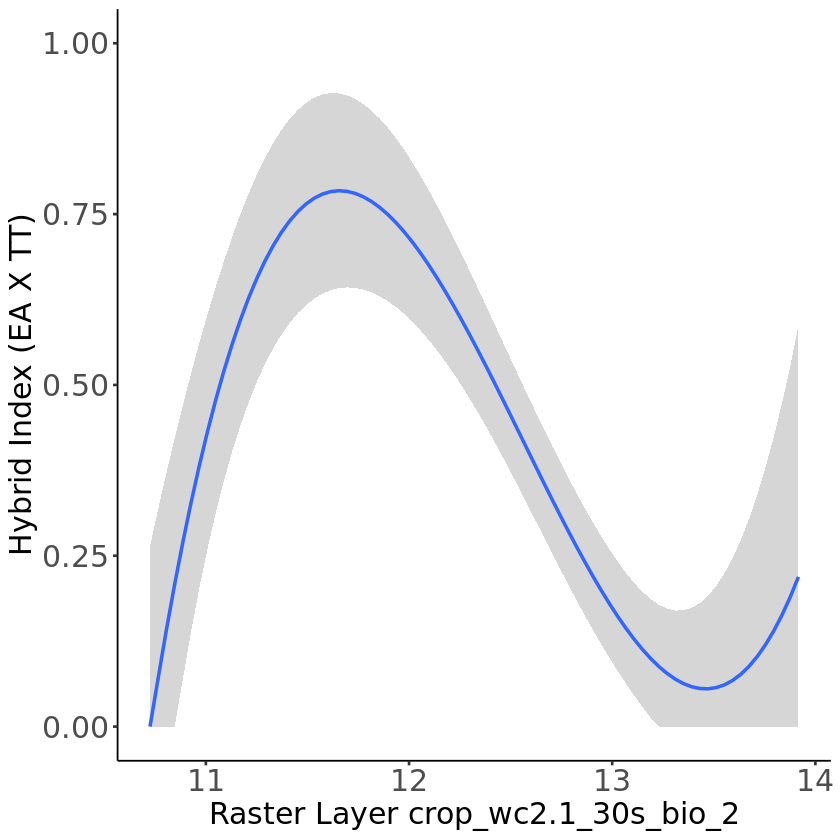

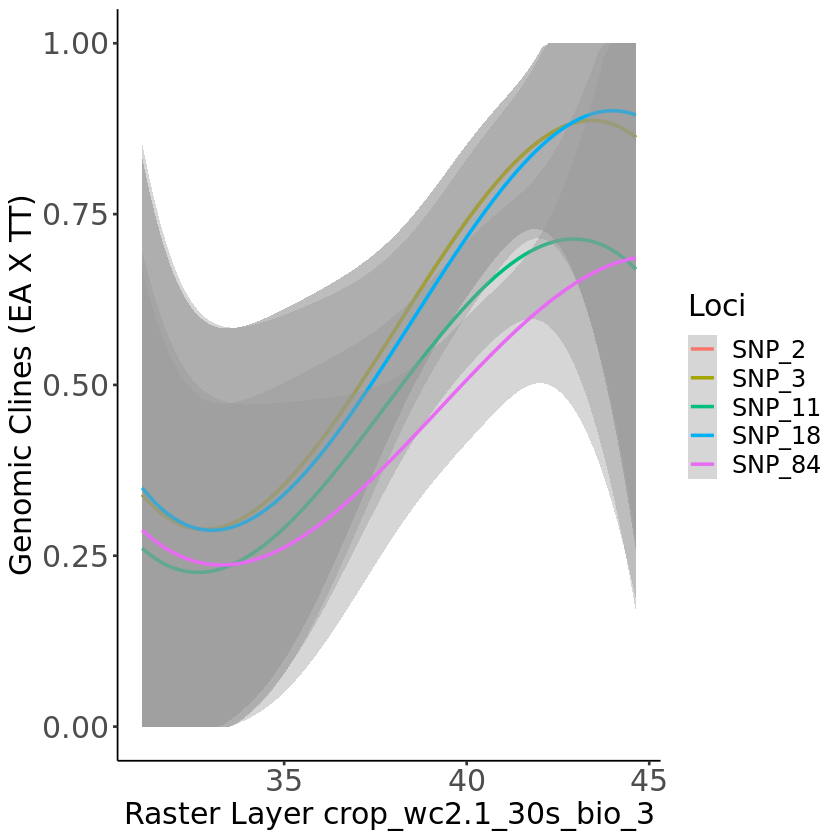

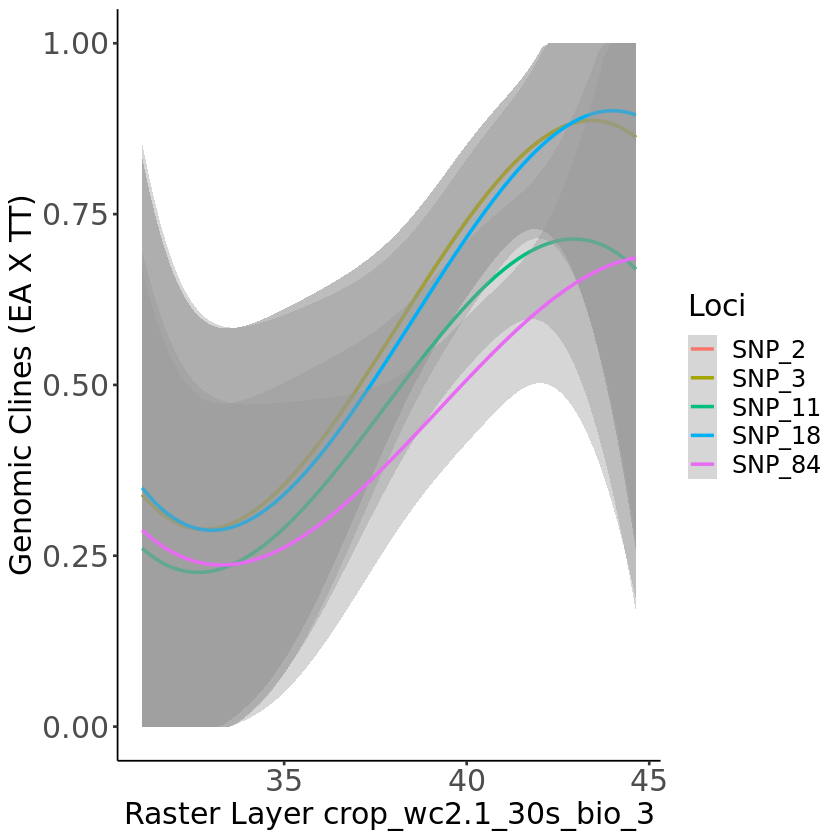

Warning message in cor.test.default(env, hi, method = cor.method):
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(env, hi, method = cor.method):
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(env, hi, method = cor.method):
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(env, hi, method = cor.method):
"Cannot compute exact p-value with ties"


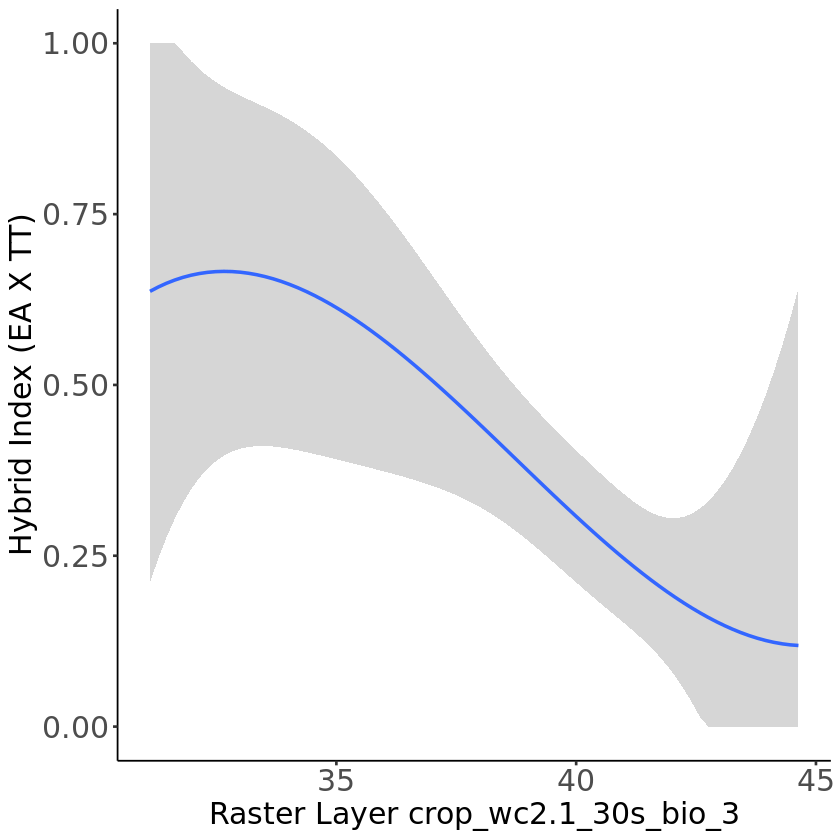

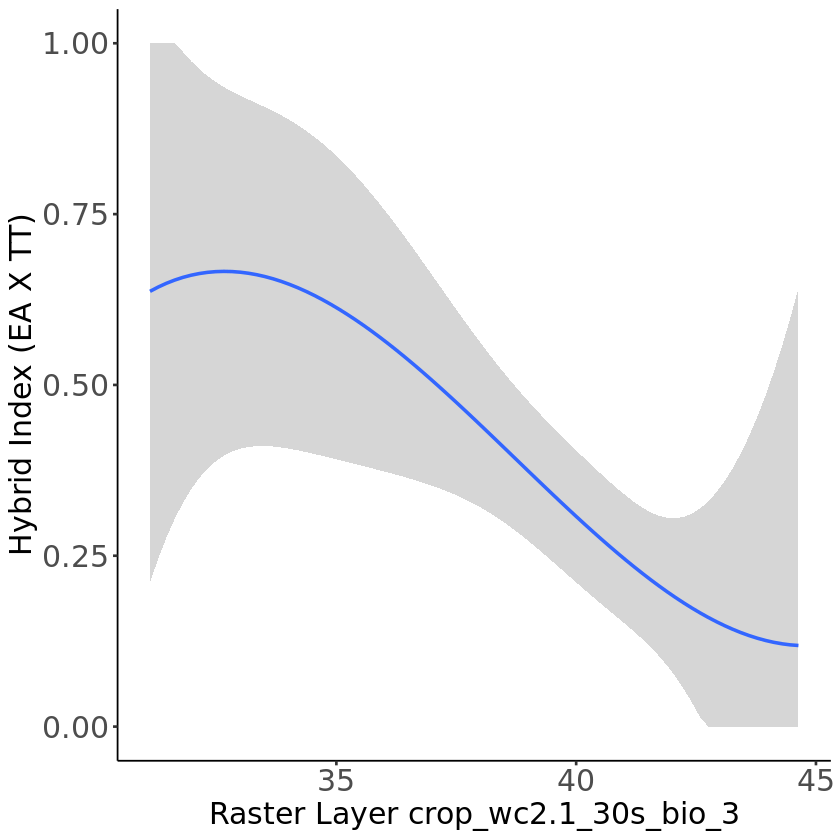

In [60]:
# Correlate genomic clines/hybrid index with environment/lat/lon
# Can use different correlation methods. E.g. pearson or kendall
clinesXenvironment(
  clineList = eatt,
  rasterPointValues = rasterPoint.list.subset,
  clineLabels = c("EA", "Het", "TT"),
  outputDIR = plotDIR,
  clineMethod = "permutation",
  prefix = "eatt",
  cor.method = "spearman",
  showPLOTS = TRUE
)

And there are your Clines X Environment plots!

Thank you for your interest in ClineHelpR! Hopefully it helps you with your analyses.

## References

Kass, J. M., Muscarella, R., Galante, P. J., Bohl, C. L., Pinilla‐Buitrago, G. E., Boria, R. A., Soley-Guardia, M., Anderson, R. P. 2021. ENMeval 2.0: redesigned for customizable and reproducible modeling of species’ niches and distributions. Methods in Ecology and Evolution, 12: 1602-1608.

Phillips, S.J., Anderson, R.P., Schapire, R.E. 2006. Maximum entropy modeling of species geographic distributions. Ecological Modelling, 190: 231-259.

Phillips, S.J., Dudík, M., Schapire, R.E. 2004. A maximum entropy approach to species distribution modeling. In Proceedings of the Twenty-First International Conference on Machine Learning, pp. 655-662.

Gompert Z., Buerkle C.A.. 2009. A powerful regression-based method for admixture mapping of isolation across the genome of hybrids. Molecular Ecology, 18: 1207–1224.

Gompert, Z., Buerkle, C.A. 2010. INTROGRESS: A software package for mapping components of isolation in hybrids. Molecular Ecology Resources, 10(2): 378-384.